In [1]:
import pypsa 
import matplotlib.pyplot as plt
plt.style.use("bmh")
import pandas as pd
import numpy as np
import os
%matplotlib inline
import seaborn as sns  ###
import cartopy.crs as ccrs
sns.set(style='darkgrid') ### seaborn gives a nice design

In [2]:
# Upload scneario 2 - Storage defined by store and links
#n = pypsa.Network("C:/Users/Max/OneDrive - University of Edinburgh/PHD-Flexibility/08_FirstPaper/Modelling-results-try2/Var-ratio-free-tech-chain/elec_s_181_ec_lv1.25_Co2L0.0-1H-EQ0.8c.nc")
n = pypsa.Network("/home/max/OneDrive/PHD-Flexibility/08_FirstPaper/Modelling-results-try2/Var-ratio-free-tech-chain/elec_s_181_ec_lv1.25_Co2L0.0-1H-EQ0.8c.nc")

INFO:pypsa.io:Imported network elec_s_181_ec_lv1.25_Co2L0.0-1H-EQ0.8c.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


In [3]:
## emission limit check. Note: Co2L0. doesnt work - therefore the 5% limit activates.
# Base 1.5 *10^9
#n.global_constraints.append(n10.global_constraints).append(n20.global_constraints).append(n40.global_constraints).append(n60.global_constraints)
n.global_constraints

,type,carrier_attribute,sense,constant,mu
name,,,,,
CO2Limit,primary_energy,co2_emissions,<=,0.000000e+00,257011.568977
lv_factor,transmission_volume_expansion_limit,"AC, DC",<=,3.967164e+08,118.377930


In [4]:
#Overview components
for c in n.iterate_components(list(n.components.keys())[2:]):
    print("Component '{}' has {} entries".format(c.name,len(c.df)))

Component 'Bus' has 543 entries
Component 'Carrier' has 12 entries
Component 'GlobalConstraint' has 2 entries
Component 'Line' has 320 entries
Component 'LineType' has 31 entries
Component 'TransformerType' has 14 entries
Component 'Link' has 1128 entries
Component 'Load' has 181 entries
Component 'Generator' has 734 entries
Component 'StorageUnit' has 183 entries
Component 'Store' has 362 entries


In [5]:
#temporal resolution
len(n.snapshots)

8760

In [6]:
#Total installed generator capacity
gen_cap = n.generators.groupby(['carrier']).p_nom_opt.sum()
gen_cap

carrier
biomass         9901.808000
geothermal       828.800000
nuclear        97710.800000
offwind-ac     84217.983293
offwind-dc    140801.852056
onwind        263498.538157
ror            34503.916704
solar         327645.373736
Name: p_nom_opt, dtype: float64

In [7]:
total_cap = n.generators.groupby(['carrier']).p_nom_opt.sum().sum()
total_cap

959109.0719461069

In [8]:
#Percentage of total capacity [%]
n.generators.groupby(['carrier']).p_nom_opt.sum().apply(lambda x: x/total_cap)*100

INFO:numexpr.utils:NumExpr defaulting to 8 threads.


carrier
biomass        1.032396
geothermal     0.086414
nuclear       10.187663
offwind-ac     8.780856
offwind-dc    14.680484
onwind        27.473261
ror            3.597497
solar         34.161430
Name: p_nom_opt, dtype: float64

In [12]:
#Share of total el. production per carrier
CCGT_energy = n.generators_t.p.sum(axis=0).filter(like="CCGT", axis=0).sum()
OCGT_energy = n.generators_t.p.sum(axis=0).filter(like="OCGT", axis=0).sum()
biomass_energy = n.generators_t.p.sum(axis=0).filter(like="biomass", axis=0).sum()
coal_energy = n.generators_t.p.sum(axis=0).filter(like="coal", axis=0).sum()
geothermal_energy = n.generators_t.p.sum(axis=0).filter(like="geothermal", axis=0).sum()
lignite_energy = n.generators_t.p.sum(axis=0).filter(like="lignite", axis=0).sum()
nuclear_energy = n.generators_t.p.sum(axis=0).filter(like="nuclear", axis=0).sum()
offwind_ac_energy = n.generators_t.p.sum(axis=0).filter(like="offwind-ac", axis=0).sum()
offwind_dc_energy = n.generators_t.p.sum(axis=0).filter(like="offwind-dc", axis=0).sum()
onwind_energy = n.generators_t.p.sum(axis=0).filter(like="onwind", axis=0).sum()
oil_energy = n.generators_t.p.sum(axis=0).filter(like="oil", axis=0).sum()
onwind_energy = n.generators_t.p.sum(axis=0).filter(like="onwind", axis=0).sum()
ror_energy = n.generators_t.p.sum(axis=0).filter(like="ror", axis=0).sum()
solar_energy = n.generators_t.p.sum(axis=0).filter(like="solar", axis=0).sum()

shares = pd.DataFrame([[CCGT_energy],[OCGT_energy],[biomass_energy],[coal_energy],[geothermal_energy],[lignite_energy],[nuclear_energy],[offwind_ac_energy],[offwind_dc_energy],[oil_energy],[onwind_energy],[ror_energy],[solar_energy]], 
                          columns=['Energy generation per year [MWh]'], 
                          index = ['CCGT','OCGT','biomass','coal','geothermal','lignite','nuclear','offwind-ac','offwind-dc','oil','onwind','ror','solar'])
#shares #MWh

In [13]:
total = shares.iloc[:].sum().iloc[0]
#total

In [14]:
shares = pd.DataFrame([[biomass_energy,biomass_energy/total,biomass_energy/(gen_cap.loc['biomass']*8760)],[geothermal_energy,geothermal_energy/total,geothermal_energy/(gen_cap.loc['geothermal']*8760)],[nuclear_energy,nuclear_energy/total, nuclear_energy/(gen_cap.loc['nuclear']*8760)],[offwind_ac_energy,offwind_ac_energy/total,offwind_ac_energy/(gen_cap.loc['offwind-ac']*8760)],[offwind_dc_energy,offwind_dc_energy/total,offwind_dc_energy/(gen_cap.loc['offwind-dc']*8760)],[onwind_energy,onwind_energy/total, onwind_energy/(gen_cap.loc['onwind']*8760)],[ror_energy,ror_energy/total,ror_energy/(gen_cap.loc['ror']*8760)],[solar_energy,solar_energy/total,solar_energy/(gen_cap.loc['solar']*8760)]], 
                          columns=['Energy generation per year [MWh]', 'in %', 'Capacity factor'], 
                          index = ['biomass','geothermal','nuclear','offwind-ac','offwind-dc','onwind','ror','solar'])

#shares

In [15]:
index_generators = n.generators_t.p.sum(axis=0).index
curtailed_power = []

for item in range(0,len(index_generators)):
    index_name = index_generators[item]  
    wind_condition = n.generators_t["p_max_pu"].filter(like=index_name, axis=1) 
    install_power_real = (n.generators["p_nom_opt"].filter(like=index_name, axis=0))
    available_power_real = wind_condition.apply(lambda x: x*install_power_real[0]) 
    dispatched_power = (n.generators_t.p.filter(like=index_name, axis=1))
    curtailed = (available_power_real-dispatched_power)/available_power_real
    if item == 0:
        curtailment = curtailed
    else:
        curtailment = curtailment.join(curtailed)

In [16]:
index_generators = n.generators_t.p.sum(axis=0).index
curtailed_power = []

for item in range(0,len(index_generators)):
    index_name = index_generators[item]  
    wind_condition = n.generators_t["p_max_pu"].filter(like=index_name, axis=1) 
    install_power_real = (n.generators["p_nom_opt"].filter(like=index_name, axis=0))
    available_power_real = wind_condition.apply(lambda x: x*install_power_real[0]) 
    dispatched_power = (n.generators_t.p.filter(like=index_name, axis=1))
    if item == 0:
        dispatch = dispatched_power
    else:
        dispatch = dispatch.join(dispatched_power)

In [17]:
index_generators = n.generators_t.p.sum(axis=0).index
curtailed_power = []

for item in range(0,len(index_generators)):
    index_name = index_generators[item]  
    wind_condition = n.generators_t["p_max_pu"].filter(like=index_name, axis=1) 
    install_power_real = (n.generators["p_nom_opt"].filter(like=index_name, axis=0))
    available_power_real = wind_condition.apply(lambda x: x*install_power_real[0]) 
    dispatched_power = (n.generators_t.p.filter(like=index_name, axis=1))
    curtailed = (available_power_real-dispatched_power)
    if item == 0:
        curtailed_power = curtailed
    else:
        curtailed_power = curtailed_power.join(curtailed)

In [18]:
generator_stats = pd.DataFrame(data=(curtailed_power.sum()).values, columns=['Curtailment_in_MWh'])
generator_stats['curtailment_in_percentage']= (curtailment.mean()).values
generator_stats['carrier']= n.generators.carrier.values
generator_stats['bus']= n.generators.bus.values
generator_stats['dispatched_power']=(dispatch.sum()).values
#generator_stats

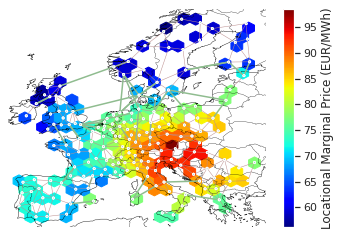

In [19]:
###Plot of Average Marginal Price###

now = n.snapshots[4] ##one specific time

fig,ax = plt.subplots(1,1,subplot_kw={"projection":ccrs.PlateCarree()})
fig.set_size_inches(6,4)

n.plot(ax=ax,line_widths=pd.Series(0.5,n.lines.index))
plt.hexbin(n.buses.x, n.buses.y, 
           gridsize=20,
           #C=n.buses_t.marginal_price.loc[now], #at one time (previous set up by scigrid)
           C=n.buses_t.marginal_price.sum()/len(n.snapshots[:]), #Marginal price averaged over the whole year (My version) 
                                                                 #- shows in which regions electricity will be cheap and where el. intensive companies should be placed.
           cmap=plt.cm.jet)

#for some reason the colorbar only works with graphs plt.plot
#and must be attached plt.colorbar

cb = plt.colorbar()
cb.set_label('Locational Marginal Price (EUR/MWh)')

In [20]:
#Table configuration:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [21]:
#Check if all carriers are assigned to colors
n.carriers['color']

name
biomass        #0c6013
geothermal     #ba91b1
nuclear        #ff9000
onwind         #235ebc
offwind-ac     #6895dd
offwind-dc     #74c6f2
solar          #f9d002
PHS            #08ad97
hydro          #08ad97
ror            #4adbc8
H2-scenario           
battery        #b8ea04
Name: color, dtype: object

In [22]:
#Color setting for missing definition
n.carriers['color'].iloc[10] = '#FFDC87'  #kind of yellow. battery-low-LCOS
n.carriers['color'].iloc[12] = '#FFDC87'  #kind of yellow. battery-high-LCOS
n.carriers['color'].iloc[11] = '#4DD1BC'  #mint green. H2 scenario

/home/max/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:671: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)


IndexError: single positional indexer is out-of-bounds

Check if nuclear is optimised:

/home/max/anaconda3/lib/python3.8/site-packages/pypsa/plot.py:159: UserWarning: Requested projection is different from current axis projection, creating new axis with requested projection.
  ax = plt.gca(projection=projection)


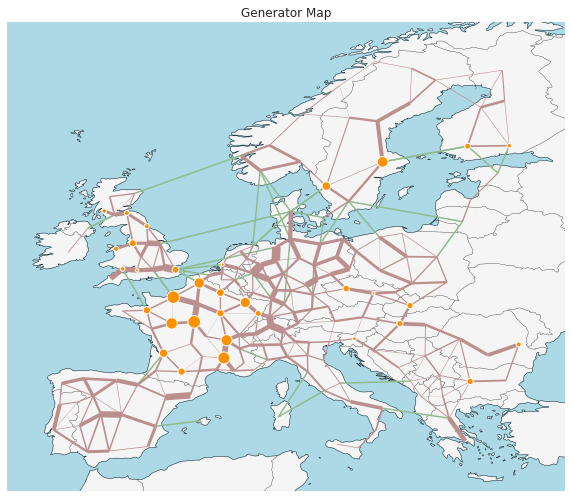

In [23]:
fig,ax = plt.subplots(
        figsize=(10,10),
        subplot_kw={"projection":ccrs.PlateCarree()} #PlateCarree(default), Mercator, Orthographic
)

#loading = (n3.lines_t.p0.abs().mean().sort_index() / (n3.lines.s_nom_opt*n.lines.s_max_pu).sort_index()).fillna(0.)

n.plot(margin=0.1, 
        ax=None, 
        geomap=True, #'10m' leads to a beautiful high resolution map 
        projection= None, 
        bus_colors='cadetblue', 
        bus_alpha=1, 
        bus_sizes=n.generators.loc[n.generators['carrier'].apply(lambda x: x in ['nuclear'])].iloc[:,:].groupby(['bus','carrier']).p_nom_opt.sum()*.00003, 
        bus_cmap=None, 
        line_colors='rosybrown', 
        link_colors='darkseagreen', #loading
        transformer_colors='orange', 
        line_widths=n.lines.s_nom_opt/3e3, 
        link_widths=1.5, 
        transformer_widths=1.5, 
        line_cmap=None, 
        link_cmap=None, #plt.cm.virdis (colordmap for line loading)
        transformer_cmap=None, 
        flow=None, 
        branch_components=None, 
        layouter=None, 
        title='Generator Map', 
        boundaries=None, 
        geometry=False, 
        jitter=None, 
        color_geomap=True)#None or True

ax.axis('off');

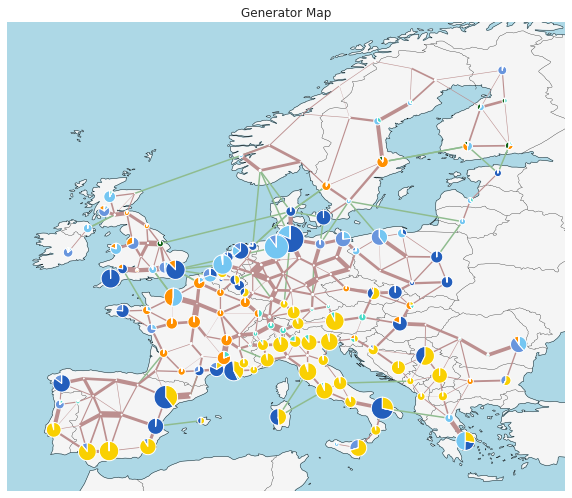

In [24]:
fig,ax = plt.subplots(
        figsize=(10,10),
        subplot_kw={"projection":ccrs.PlateCarree()} #PlateCarree(default), Mercator, Orthographic
)

#loading = (n3.lines_t.p0.abs().mean().sort_index() / (n3.lines.s_nom_opt*n.lines.s_max_pu).sort_index()).fillna(0.)

n.plot(margin=0.1, 
        ax=None, 
        geomap=True, #'10m' leads to a beautiful high resolution map 
        projection= None, 
        bus_colors='cadetblue', 
        bus_alpha=1, 
        bus_sizes=n.generators.iloc[:,:].groupby(['bus','carrier']).p_nom_opt.sum()*.00003, 
        bus_cmap=None, 
        line_colors='rosybrown', 
        link_colors='darkseagreen', #loading
        transformer_colors='orange', 
        line_widths=n.lines.s_nom_opt/3e3, 
        link_widths=1.5, 
        transformer_widths=1.5, 
        line_cmap=None, 
        link_cmap=None, #plt.cm.virdis (colordmap for line loading)
        transformer_cmap=None, 
        flow=None, 
        branch_components=None, 
        layouter=None, 
        title='Generator Map', 
        boundaries=None, 
        geometry=False, 
        jitter=None, 
        color_geomap=True)#None or True

ax.axis('off');

In [25]:
###map.py von Fabian
"""
Network expansion plotting functions.
"""

__author__ = "Fabian Neumann (KIT)"
__copyright__ = "Copyright 2019-2020 Fabian Neumann (KIT), GNU GPL 3"

import pandas as pd
import numpy as np

import cartopy.crs as ccrs
import matplotlib.pyplot as plt

from matplotlib.patches import Circle, Ellipse
from matplotlib.legend_handler import HandlerPatch




def make_handler_map_to_scale_circles_as_in(ax, dont_resize_actively=False):
    fig = ax.get_figure()

    def axes2pt():
        return np.diff(ax.transData.transform([(0, 0), (1, 1)]), axis=0)[0] * (
            300.0 / fig.dpi
        )

    ellipses = []
    if not dont_resize_actively:

        def update_width_height(event):
            dist = axes2pt()
            for e, radius in ellipses:
                e.width, e.height = 2.0 * radius * dist

        fig.canvas.mpl_connect("resize_event", update_width_height)
        ax.callbacks.connect("xlim_changed", update_width_height)
        ax.callbacks.connect("ylim_changed", update_width_height)

    def legend_circle_handler(
        legend, orig_handle, xdescent, ydescent, width, height, fontsize
    ):
        w, h = 2.0 * orig_handle.get_radius() * axes2pt()
        e = Ellipse(
            xy=(0.5 * width - 0.5 * xdescent, 0.5 * height - 0.5 * ydescent),
            width=w,
            height=w,
        )
        ellipses.append((e, orig_handle.get_radius()))
        return e

    return {Circle: HandlerPatch(patch_func=legend_circle_handler)}


def make_legend_circles_for(sizes, scale=1.0, **kw):
    return [Circle((0, 0), radius=(s / scale) ** 0.5, **kw) for s in sizes]


def add_legend(ax, bus_factor, branch_factor):

    handles = []
    labels = []
    for s in (2, 5, 10):
        handles.append(
            plt.Line2D([0], [0], color="rosybrown", linewidth=s * 1e3 / branch_factor)
        )
        labels.append(f"{s} GW")
    l1 = ax.legend(
        handles,
        labels,
        loc="upper left",
        bbox_to_anchor=(0, 0),
        frameon=False,
        labelspacing=0.8,
        handletextpad=1.5,
        title="HVAC Line Capacity",
    )
    ax.add_artist(l1)

    handles = []
    labels = []
    for s in (2, 5, 10):
        handles.append(
            plt.Line2D(
                [0], [0], color="darkseagreen", linewidth=s * 1e3 / branch_factor
            )
        )
        labels.append(f"{s} GW")
    l2 = ax.legend(
        handles,
        labels,
        loc="upper left",
        bbox_to_anchor=(0.2, -0.0),
        frameon=False,
        labelspacing=0.8,
        handletextpad=1.5,
        title="HVDC Link Capacity",
    )
    ax.add_artist(l2)

    handles = []
    labels = []
    if "Load" in n.carriers.index:
        n.carriers = n.carriers.drop("Load")
    for name, carrier in n.carriers.iterrows():
        handles.append(
            plt.Line2D(
                [0], [0], color=carrier.color, marker="o", markersize=8, linewidth=0
            )
        )
        labels.append(carrier.nice_name)
    l3 = ax.legend(
        handles,
        labels,
        loc="upper center",
        bbox_to_anchor=(0.58, -0.0),  # bbox_to_anchor=(0.72, -0.05),
        handletextpad=0.0,
        columnspacing=0.5,
        ncol=2,
        title="Technology",
        frameon=False,
    )
    ax.add_artist(l3)

    circles = [1000, 500, 100]
    handles = make_legend_circles_for(circles, scale=bus_factor, facecolor="lightgray")
    labels = [f"{int(s/1e2)} GW" for s in circles]
    l4 = ax.legend(
        handles,
        labels,
        loc="upper left",
        bbox_to_anchor=(0.82, 0.0),
        frameon=False,
        labelspacing=2.5,
        title="Generation",
        handler_map=make_handler_map_to_scale_circles_as_in(ax, True),
    )
    ax.add_artist(l4)


def plot_network(n, fn=None):

    bus_factor = 5.5e4
    branch_factor = 2e3

    fields = ["bus", "carrier", "p_nom_opt"]
    pie_components = pd.concat(
        [
            n.generators.loc[n.generators.carrier != "load", fields],
            n.storage_units[fields],
        ]
    )
    bus_sizes = pie_components.groupby(["bus", "carrier"]).p_nom_opt.sum() / bus_factor

    def clip(df, thres=500):
        return df.where(df > thres, other=0.0)

    line_widths = clip(n.lines.s_nom_opt - n.lines.s_nom) / branch_factor
    link_widths = clip(n.links.p_nom_opt - n.links.p_nom) / branch_factor
    line_widths_opt = clip(n.lines.s_nom_opt) / branch_factor

    fig, ax = plt.subplots(
        figsize=(11, 11), subplot_kw={"projection": ccrs.PlateCarree()}
    )

    n.plot(
        ax=ax,
        bus_sizes=bus_sizes,
        color_geomap=True,
        bus_alpha=0.7,
        line_widths=line_widths_opt,
        line_colors="#dddddd",
    )

    n.plot(
        ax=ax,
        geomap=False,
        bus_sizes=0,
        line_widths=line_widths,
        link_widths=link_widths,
    )

    add_legend(ax, bus_factor, branch_factor)

    if fn is not None:
        plt.savefig(fn, bbox_inches="tight")

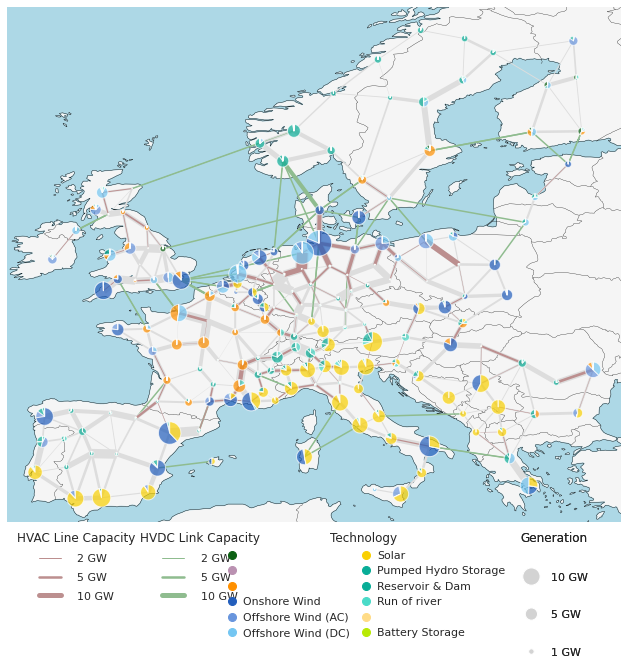

In [26]:
plot_network(n, fn=None)

## Formal analysis

### 1. Emission reduction and system cost data

In [27]:
n20 = n

In [28]:
#Single scenario | Multiple scenarios in comments

data = [n20.objective / 1e9] #[n05.objective / 1e9 , n10.objective/ 1e9 , n20.objective/ 1e9 , n40.objective/ 1e9 , n60.objective/ 1e9 ] #Billion euro
index = ['0%'] #['5%', '10%', '20%', '40%', '60%']
data2 = n20.objective/(n.loads_t.p_set.sum(axis=1).sum())
network_obj = pd.DataFrame({'Percentage of EU emission in 2013':index,
                           'Total System Cost [B€]':data,'Average el. system price [€/MWh]':data2 }, 
                           columns = ['Percentage of EU emission in 2013','Total System Cost [B€]','Average el. system price [€/MWh]'],
                          )
network_obj

,Percentage of EU emission in 2013,Total System Cost [B€],Average el. system price [€/MWh]
0,0%,139.731758,44.533275


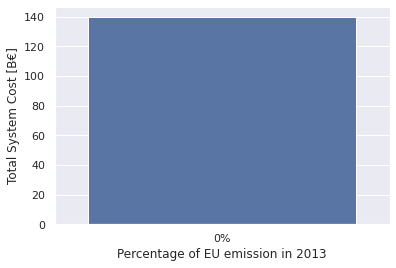

In [29]:
sns.barplot(x = 'Percentage of EU emission in 2013', y = 'Total System Cost [B€]', data = network_obj)

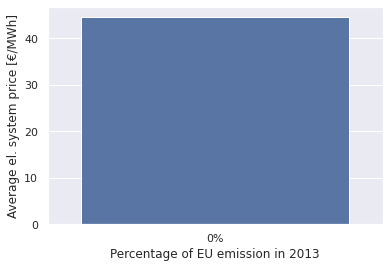

In [30]:
sns.barplot(x = 'Percentage of EU emission in 2013', y = 'Average el. system price [€/MWh]', data = network_obj)

### 2. Amount of storage

##### Step 1. Check the aggregated values

In [31]:
#filters only storage components
storage_comp = n.links.iloc[46:] 
#storage_comp

In [272]:
#Total demand for storage components
storage_comp.groupby(['carrier']).p_nom_opt.sum()

#Result. Both expensive and cheap storage are optimized.

carrier
H2 electrolysis-high-LCOS       326.960376
H2 electrolysis-low-LCOS      80314.831561
H2 fuel cell-high-LCOS       156736.410246
H2 fuel cell-low-LCOS         54382.199401
battery charger                3052.492664
battery discharger             3391.658516
Name: p_nom_opt, dtype: float64

In [33]:
n.storage_units.groupby(['carrier']).p_nom_opt.sum()/1000

carrier
PHS      54.593581
hydro    99.562201
Name: p_nom_opt, dtype: float64

In [34]:
#Total storage size
n.stores.iloc[:,:].groupby(['carrier']).e_nom_opt.sum()*1 #MWh

carrier
H2-scenario    1.362259e+07
battery        9.758074e+03
Name: e_nom_opt, dtype: float64

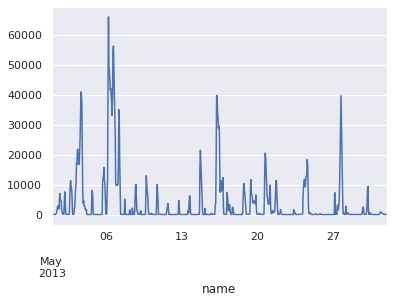

In [35]:
n.links_t#.p.groupby(['carrier']).sum()   #.iloc[:,:]#.groupby(['carrier']).p.sum()
n.links_t.p0.loc["2013-5":"2013-5"].filter(like="H2-scenario Fuel Cell-high").sum(axis=1).plot()

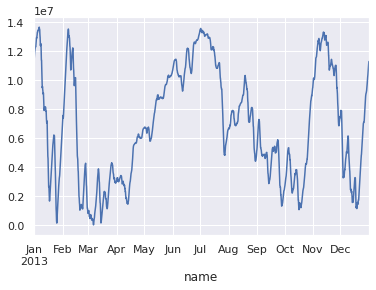

In [36]:
n.stores_t.e.loc["2013-01":"2013-12"].filter(like="H2-scenario").sum(axis=1).plot()

In [37]:
#n.components

In [38]:
#n.stores_t.e.head()

##### Step 2. Check the distribution of electrolysor

In [39]:
#Adding new colors for plot
add_colors = pd.DataFrame([[0.000, '#f05d7c', 'Option A'],[0.000, '#74e2d1', 'Option B'],[0.000, '#f05d7c', 'Option A'],[0.000, '#74e2d1', 'Option B']], 
                          columns=['co2_emissions', 'color', 'nice_name'], 
                          index = ['H2 fuel cell-high-LCOS','H2 fuel cell-low-LCOS', 'H2 electrolysis-high-LCOS','H2 electrolysis-low-LCOS'])
#['H2 fuel cell-high-LCOS','H2 fuel cell-low-LCOS']
#['H2 electrolysis-high-LCOS','H2 electrolysis-low-LCOS']
add_colors

,co2_emissions,color,nice_name
H2 fuel cell-high-LCOS,0.0,#f05d7c,Option A
H2 fuel cell-low-LCOS,0.0,#74e2d1,Option B
H2 electrolysis-high-LCOS,0.0,#f05d7c,Option A
H2 electrolysis-low-LCOS,0.0,#74e2d1,Option B


In [40]:
#Check here if concat(adding new rows) is correct
pd.concat([n.carriers,add_colors])

,co2_emissions,color,nice_name
biomass,0.000,#0c6013,
geothermal,0.026,#ba91b1,
nuclear,0.000,#ff9000,
onwind,0.000,#235ebc,Onshore Wind
offwind-ac,0.000,#6895dd,Offshore Wind (AC)
offwind-dc,0.000,#74c6f2,Offshore Wind (DC)
solar,0.000,#f9d002,Solar
PHS,0.000,#08ad97,Pumped Hydro Storage
hydro,0.000,#08ad97,Reservoir & Dam
ror,0.000,#4adbc8,Run of river


In [41]:
n.carriers = pd.concat([n.carriers,add_colors])

In [42]:
n.carriers.at['biomass', 'nice_name'] = 'Biomass'

In [43]:
n.carriers.at['H2-scenario-h-LCOS', 'color'] = '#141414'
n.carriers

,co2_emissions,color,nice_name
biomass,0.000,#0c6013,Biomass
geothermal,0.026,#ba91b1,
nuclear,0.000,#ff9000,
onwind,0.000,#235ebc,Onshore Wind
offwind-ac,0.000,#6895dd,Offshore Wind (AC)
offwind-dc,0.000,#74c6f2,Offshore Wind (DC)
solar,0.000,#f9d002,Solar
PHS,0.000,#08ad97,Pumped Hydro Storage
hydro,0.000,#08ad97,Reservoir & Dam
ror,0.000,#4adbc8,Run of river


Plot electrolysor distribution:

In [44]:
#Use of lambda to filter perfectly
#storage_comp.loc[storage_comp['carrier'].apply(lambda x: x in ['H2 electrolysis-high-LCOS','H2 electrolysis-low-LCOS'])]

In [45]:
#Input for plot
#storage_comp.loc[storage_comp['carrier'].apply(lambda x: x in ['H2 electrolysis-high-LCOS','H2 electrolysis-low-LCOS'])].iloc[:,:].groupby(['bus0','carrier']).p_nom_opt.sum()*1000

/home/max/anaconda3/lib/python3.8/site-packages/pypsa/plot.py:159: UserWarning: Requested projection is different from current axis projection, creating new axis with requested projection.
  ax = plt.gca(projection=projection)


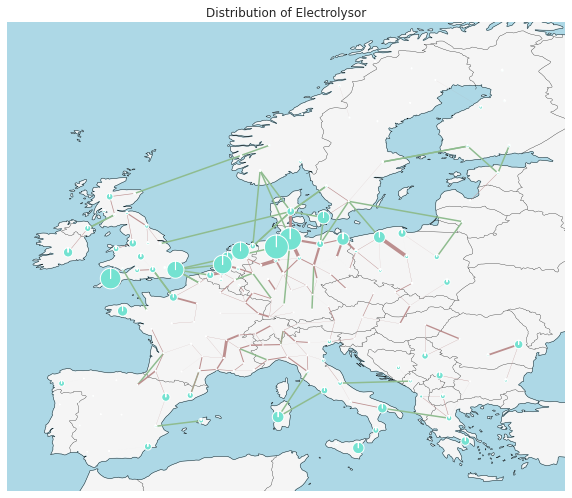

In [46]:
fig,ax = plt.subplots(
        figsize=(10,10),
        subplot_kw={"projection":ccrs.PlateCarree()} #PlateCarree(default), Mercator, Orthographic
)

#loading = (n3.lines_t.p0.abs().mean().sort_index() / (n3.lines.s_nom_opt*n.lines.s_max_pu).sort_index()).fillna(0.)

n.plot(margin=0.1, 
        ax=None, 
        geomap=True, #'10m' leads to a beautiful high resolution map 
        projection= None, 
        bus_colors='cadetblue', 
        bus_alpha=1, 
        bus_sizes= storage_comp.loc[storage_comp['carrier'].apply(lambda x: x in ['H2 electrolysis-high-LCOS','H2 electrolysis-low-LCOS'])].iloc[:,:].groupby(['bus0','carrier']).p_nom_opt.sum()*0.0001, 
        bus_cmap=None, 
        line_colors='rosybrown', 
        link_colors='darkseagreen', #loading
        transformer_colors='orange', 
        line_widths=(n.lines.s_nom_opt-n.lines.s_nom)/3e3, 
        link_widths=1.5, 
        transformer_widths=1.5, 
        line_cmap=None, 
        link_cmap=None, #plt.cm.virdis (colordmap for line loading)
        transformer_cmap=None, 
        flow=None, 
        branch_components=None, 
        layouter=None, 
        title='Distribution of Electrolysor', 
        boundaries=None, 
        geometry=False, 
        jitter=None, 
        color_geomap=True)#None or True

ax.axis('off');

Plot fuel cell distribution:

In [47]:
#Use of lambda to filter perfectly
storage_comp.loc[storage_comp['carrier'].apply(lambda x: x in ['H2 fuel cell-high-LCOS','H2 fuel cell-low-LCOS'])]

,bus0,bus1,carrier,geometry,length,p_nom,tags,under_construction,underground,p_min_pu,underwater_fraction,capital_cost,efficiency,p_nom_extendable,p_nom_min,p_nom_opt,charger_ratio,type,p_nom_max,p_set,p_max_pu,marginal_cost,terrain_factor
name,,,,,,,,,,,,,,,,,,,,,,,
AL0 0 H2-scenario Fuel Cell-high-LCOS,AL0 0 H2-scenario,AL0 0,H2 fuel cell-high-LCOS,,0.0,0.0,,NaN,NaN,0.0,NaN,30518.560402,0.58,True,0.0,210.194755,NaN,,inf,0.0,1.0,0.0,1.0
AT0 0 H2-scenario Fuel Cell-high-LCOS,AT0 0 H2-scenario,AT0 0,H2 fuel cell-high-LCOS,,0.0,0.0,,NaN,NaN,0.0,NaN,30518.560402,0.58,True,0.0,7.857323,NaN,,inf,0.0,1.0,0.0,1.0
AT0 1 H2-scenario Fuel Cell-high-LCOS,AT0 1 H2-scenario,AT0 1,H2 fuel cell-high-LCOS,,0.0,0.0,,NaN,NaN,0.0,NaN,30518.560402,0.58,True,0.0,12.146397,NaN,,inf,0.0,1.0,0.0,1.0
AT0 2 H2-scenario Fuel Cell-high-LCOS,AT0 2 H2-scenario,AT0 2,H2 fuel cell-high-LCOS,,0.0,0.0,,NaN,NaN,0.0,NaN,30518.560402,0.58,True,0.0,11.824341,NaN,,inf,0.0,1.0,0.0,1.0
BA0 0 H2-scenario Fuel Cell-high-LCOS,BA0 0 H2-scenario,BA0 0,H2 fuel cell-high-LCOS,,0.0,0.0,,NaN,NaN,0.0,NaN,30518.560402,0.58,True,0.0,482.000991,NaN,,inf,0.0,1.0,0.0,1.0
BE0 0 H2-scenario Fuel Cell-high-LCOS,BE0 0 H2-scenario,BE0 0,H2 fuel cell-high-LCOS,,0.0,0.0,,NaN,NaN,0.0,NaN,30518.560402,0.58,True,0.0,1841.357448,NaN,,inf,0.0,1.0,0.0,1.0
BE0 1 H2-scenario Fuel Cell-high-LCOS,BE0 1 H2-scenario,BE0 1,H2 fuel cell-high-LCOS,,0.0,0.0,,NaN,NaN,0.0,NaN,30518.560402,0.58,True,0.0,336.608044,NaN,,inf,0.0,1.0,0.0,1.0
BE0 2 H2-scenario Fuel Cell-high-LCOS,BE0 2 H2-scenario,BE0 2,H2 fuel cell-high-LCOS,,0.0,0.0,,NaN,NaN,0.0,NaN,30518.560402,0.58,True,0.0,459.551693,NaN,,inf,0.0,1.0,0.0,1.0
BE0 3 H2-scenario Fuel Cell-high-LCOS,BE0 3 H2-scenario,BE0 3,H2 fuel cell-high-LCOS,,0.0,0.0,,NaN,NaN,0.0,NaN,30518.560402,0.58,True,0.0,822.637219,NaN,,inf,0.0,1.0,0.0,1.0


In [48]:
#Input for plot
storage_comp.loc[storage_comp['carrier'].apply(lambda x: x in ['H2 fuel cell-high-LCOS','H2 fuel cell-low-LCOS'])].iloc[:,:].groupby(['bus1','carrier']).p_nom_opt.sum()*1000

bus1    carrier               
AL0 0   H2 fuel cell-high-LCOS    2.101948e+05
        H2 fuel cell-low-LCOS     2.427952e+04
AT0 0   H2 fuel cell-high-LCOS    7.857323e+03
        H2 fuel cell-low-LCOS     2.043050e+04
AT0 1   H2 fuel cell-high-LCOS    1.214640e+04
        H2 fuel cell-low-LCOS     7.958805e+05
AT0 2   H2 fuel cell-high-LCOS    1.182434e+04
        H2 fuel cell-low-LCOS     5.910454e+04
BA0 0   H2 fuel cell-high-LCOS    4.820010e+05
        H2 fuel cell-low-LCOS     5.376056e+05
BE0 0   H2 fuel cell-high-LCOS    1.841357e+06
        H2 fuel cell-low-LCOS     3.170529e+05
BE0 1   H2 fuel cell-high-LCOS    3.366080e+05
        H2 fuel cell-low-LCOS     7.222864e+04
BE0 2   H2 fuel cell-high-LCOS    4.595517e+05
        H2 fuel cell-low-LCOS     1.524586e+05
BE0 3   H2 fuel cell-high-LCOS    8.226372e+05
        H2 fuel cell-low-LCOS     7.118334e+05
BE0 4   H2 fuel cell-high-LCOS    1.126729e+05
        H2 fuel cell-low-LCOS     6.683466e+04
BG0 0   H2 fuel cell-high-LCO

/home/max/anaconda3/lib/python3.8/site-packages/pypsa/plot.py:159: UserWarning: Requested projection is different from current axis projection, creating new axis with requested projection.
  ax = plt.gca(projection=projection)


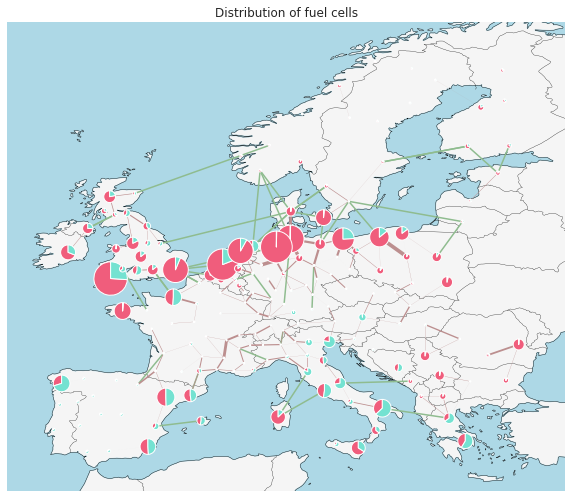

In [49]:
fig,ax = plt.subplots(
        figsize=(10,10),
        subplot_kw={"projection":ccrs.PlateCarree()} #PlateCarree(default), Mercator, Orthographic
)

#loading = (n3.lines_t.p0.abs().mean().sort_index() / (n3.lines.s_nom_opt*n.lines.s_max_pu).sort_index()).fillna(0.)

n.plot(margin=0.1, 
        ax=None, 
        geomap=True, #'10m' leads to a beautiful high resolution map 
        projection= None, 
        bus_colors='cadetblue', 
        bus_alpha=1, 
        bus_sizes= storage_comp.loc[storage_comp['carrier'].apply(lambda x: x in ['H2 fuel cell-high-LCOS','H2 fuel cell-low-LCOS'])].iloc[:,:].groupby(['bus1','carrier']).p_nom_opt.sum()*0.0001, 
        bus_cmap=None, 
        line_colors='rosybrown', 
        link_colors='darkseagreen', #loading
        transformer_colors='orange', 
        line_widths=(n.lines.s_nom_opt-n.lines.s_nom)/3e3, 
        link_widths=1.5, 
        transformer_widths=1.5, 
        line_cmap=None, 
        link_cmap=None, #plt.cm.virdis (colordmap for line loading)
        transformer_cmap=None, 
        flow=None, 
        branch_components=None, 
        layouter=None, 
        title='Distribution of fuel cells', 
        boundaries=None, 
        geometry=False, 
        jitter=None, 
        color_geomap=True)#None or True

ax.axis('off');

In [50]:
#n.stores.loc[n.stores['carrier'].apply(lambda x: x in ['H2-scenario'])].iloc[:,:]

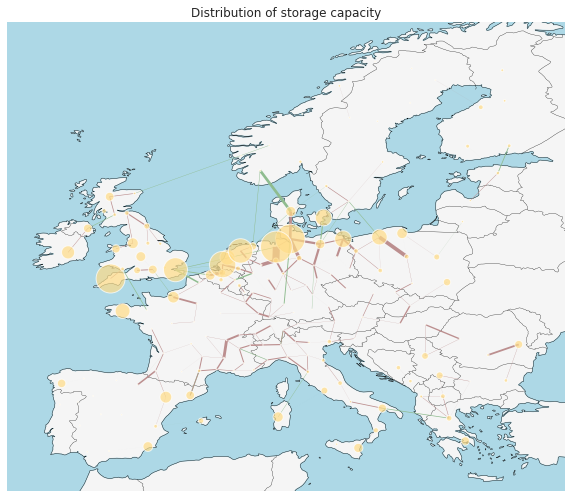

In [51]:
fig,ax = plt.subplots(
        figsize=(10,10),
        subplot_kw={"projection":ccrs.PlateCarree()} #PlateCarree(default), Mercator, Orthographic
)

#loading = (n3.lines_t.p0.abs().mean().sort_index() / (n3.lines.s_nom_opt*n.lines.s_max_pu).sort_index()).fillna(0.)

n.plot(margin=0.1, 
        ax=None, 
        geomap=True, #'10m' leads to a beautiful high resolution map 
        projection= None, 
        bus_colors='cadetblue', 
        bus_alpha=0.7, 
        bus_sizes= n.stores.loc[n.stores['carrier'].apply(lambda x: x in ['H2-scenario'])].iloc[:,:].groupby(['bus','carrier']).e_nom_opt.sum()*0.000001, 
        bus_cmap=None, 
        line_colors='rosybrown', 
        link_colors='darkseagreen', #loading
        transformer_colors='orange', 
        line_widths=(n.lines.s_nom_opt-n.lines.s_nom)/3e3, 
        link_widths= (n.links.p_nom_opt-n.links.p_nom)/3e3, 
        transformer_widths=1.5, 
        line_cmap=None, 
        link_cmap=None, #plt.cm.virdis (colordmap for line loading)
        transformer_cmap=None, 
        flow=None, 
        branch_components=None, 
        layouter=None, 
        title='Distribution of storage capacity', 
        boundaries=None, 
        geometry=False, 
        jitter=None, 
        color_geomap=True)#None or True

ax.axis('off');

Plot of storage distribution:

AssertionError: The first MultiIndex level of bus_sizes must contain buses

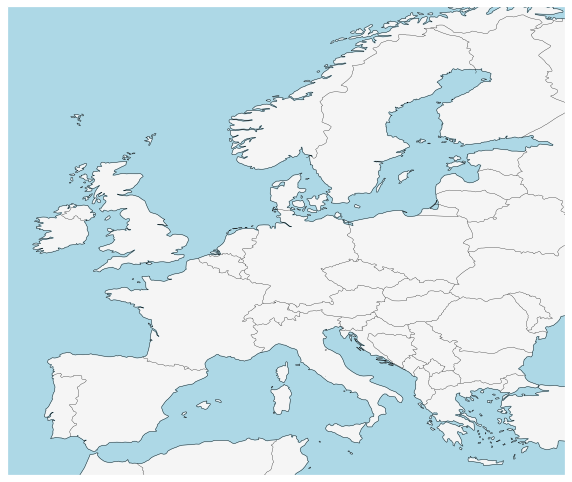

In [52]:
fig,ax = plt.subplots(
        figsize=(10,10),
        subplot_kw={"projection":ccrs.PlateCarree()} #PlateCarree(default), Mercator, Orthographic
)

#loading = (n3.lines_t.p0.abs().mean().sort_index() / (n3.lines.s_nom_opt*n.lines.s_max_pu).sort_index()).fillna(0.)

n.plot(margin=0.1, 
        ax=None, 
        geomap=True, #'10m' leads to a beautiful high resolution map 
        projection= None, 
        bus_colors='cadetblue', 
        bus_alpha=1, 
        bus_sizes= n.stores.loc[n.stores['carrier'].apply(lambda x: x in ['H2-scenario'])].iloc[:,:].groupby([n.stores.loc[n.stores['carrier'].apply(lambda x: x in ['H2-scenario'])].bus.str[:6],'carrier']).e_nom_opt.sum()*0.001, 
        bus_cmap=None, 
        line_colors='rosybrown', 
        link_colors='darkseagreen', #loading
        transformer_colors='orange', 
        line_widths=(n.lines.s_nom_opt-n.lines.s_nom)/1e3, 
        link_widths= None, 
        transformer_widths=1.5, 
        line_cmap=None, 
        link_cmap=None, #plt.cm.virdis (colordmap for line loading)
        transformer_cmap=None, 
        flow=None, 
        branch_components=None, 
        layouter=None, 
        title='Distribution of storage capacity', 
        boundaries=None, 
        geometry=False, 
        jitter=None, 
        color_geomap=True)#None or True

ax.axis('off');

In [53]:
#n.stores.rename(columns = {"bus1": "bus"},inplace = True)

In [54]:
n.buses

,v_nom,x,y,country,control,generator,carrier,type,v_mag_pu_set,v_mag_pu_min,v_mag_pu_max,sub_network
name,,,,,,,,,,,,
AL0 0,380.0,19.894573,41.561804,AL,Slack,AL0 0 offwind-ac,AC,,1.0,0.0,inf,
AT0 0,380.0,13.160522,47.436369,AT,PQ,,AC,,1.0,0.0,inf,
AT0 1,380.0,15.316111,47.741364,AT,PQ,,AC,,1.0,0.0,inf,
AT0 2,380.0,10.293250,47.248827,AT,PQ,,AC,,1.0,0.0,inf,
BA0 0,380.0,18.122704,43.811367,BA,PQ,,AC,,1.0,0.0,inf,
BE0 0,380.0,3.448530,51.022776,BE,PQ,,AC,,1.0,0.0,inf,
BE0 1,380.0,5.715942,50.215122,BE,PQ,,AC,,1.0,0.0,inf,
BE0 2,380.0,4.293519,50.664275,BE,PQ,,AC,,1.0,0.0,inf,
BE0 3,380.0,4.394989,51.207523,BE,PQ,,AC,,1.0,0.0,inf,


In [55]:
n.stores

,bus,carrier,e_nom_extendable,e_cyclic,capital_cost,marginal_cost,e_nom_opt,type,e_nom,e_nom_min,e_nom_max,e_min_pu,e_max_pu,e_initial,p_set,q_set,sign,standing_loss
name,,,,,,,,,,,,,,,,,,
AL0 0 H2-scenario,AL0 0 H2-scenario,H2-scenario,True,True,597.212714,0.010009,1.252621e+04,,0.0,0.0,inf,0.0,1.0,0.0,0.0,0.0,1.0,0.0
AT0 0 H2-scenario,AT0 0 H2-scenario,H2-scenario,True,True,597.212714,0.010077,4.550030e+02,,0.0,0.0,inf,0.0,1.0,0.0,0.0,0.0,1.0,0.0
AT0 1 H2-scenario,AT0 1 H2-scenario,H2-scenario,True,True,597.212714,0.009041,3.499632e+03,,0.0,0.0,inf,0.0,1.0,0.0,0.0,0.0,1.0,0.0
AT0 2 H2-scenario,AT0 2 H2-scenario,H2-scenario,True,True,597.212714,0.009081,1.050024e+03,,0.0,0.0,inf,0.0,1.0,0.0,0.0,0.0,1.0,0.0
BA0 0 H2-scenario,BA0 0 H2-scenario,H2-scenario,True,True,597.212714,0.009187,2.900612e+04,,0.0,0.0,inf,0.0,1.0,0.0,0.0,0.0,1.0,0.0
BE0 0 H2-scenario,BE0 0 H2-scenario,H2-scenario,True,True,597.212714,0.009677,1.458558e+05,,0.0,0.0,inf,0.0,1.0,0.0,0.0,0.0,1.0,0.0
BE0 1 H2-scenario,BE0 1 H2-scenario,H2-scenario,True,True,597.212714,0.010981,1.994894e+04,,0.0,0.0,inf,0.0,1.0,0.0,0.0,0.0,1.0,0.0
BE0 2 H2-scenario,BE0 2 H2-scenario,H2-scenario,True,True,597.212714,0.009913,2.705440e+04,,0.0,0.0,inf,0.0,1.0,0.0,0.0,0.0,1.0,0.0
BE0 3 H2-scenario,BE0 3 H2-scenario,H2-scenario,True,True,597.212714,0.010901,6.504326e+04,,0.0,0.0,inf,0.0,1.0,0.0,0.0,0.0,1.0,0.0


In [56]:
n.links

,bus0,bus1,carrier,geometry,length,p_nom,tags,under_construction,underground,p_min_pu,underwater_fraction,capital_cost,efficiency,p_nom_extendable,p_nom_min,p_nom_opt,charger_ratio,type,p_nom_max,p_set,p_max_pu,marginal_cost,terrain_factor
name,,,,,,,,,,,,,,,,,,,,,,,
14547,IT0 1,GR0 0,DC,"LINESTRING(21.0892517161789 39.3174860744064,2...",562.773235,500.0,,0.0,0.0,-1.0,0.296627,61072.658975,1.000,True,500.0,2571.569354,NaN,,inf,0.0,1.0,0.0,1.0
5686,ES2 0,ES0 5,DC,"LINESTRING(2.48932993486183 39.561252379133,1....",385.160438,400.0,"""MW""=>""None"", ""TSO""=>""None"", ""oid""=>""32590"", ""...",0.0,0.0,-1.0,0.571199,62374.234233,1.000,True,400.0,465.002257,NaN,,inf,0.0,1.0,0.0,1.0
14539,ME0 0,IT0 3,DC,"LINESTRING(14.0986517070226 42.4133438660838,1...",560.240709,0.0,,1.0,0.0,-1.0,0.667788,92473.271253,1.000,True,0.0,3.783066,NaN,,inf,0.0,1.0,0.0,1.0
12998,IT0 14,IT1 0,DC,"LINESTRING(9.17009350125146 41.2967653544603,9...",474.460941,1000.0,,0.0,0.0,-1.0,0.861111,94440.914698,1.000,True,1000.0,1001.054845,NaN,,inf,0.0,1.0,0.0,1.0
14562,FR0 11,ES0 4,DC,"LINESTRING(2.98259070757654 42.2776059846425,2...",274.988001,2000.0,,0.0,0.0,-1.0,0.000000,24730.919888,1.000,True,2000.0,5024.190470,NaN,,inf,0.0,1.0,0.0,1.0
14538,DE0 10,BE0 4,DC,"LINESTRING(6.43068069229957 50.8136946409214,6...",142.265932,0.0,,1.0,0.0,-1.0,0.000000,19671.692447,1.000,True,0.0,3746.137315,NaN,,inf,0.0,1.0,0.0,1.0
14550,GB5 16,NL0 3,DC,"LINESTRING(4.04528166772434 51.9611233898246,2...",322.015173,1000.0,,0.0,0.0,-1.0,0.707068,61131.247331,1.000,True,1000.0,1550.585978,NaN,,inf,0.0,1.0,0.0,1.0
14537,GB5 16,BE0 0,DC,"LINESTRING(3.25699821065925 51.2773723094758,1...",242.840052,0.0,,1.0,0.0,-1.0,0.455185,40307.341101,1.000,True,0.0,2353.148510,NaN,,inf,0.0,1.0,0.0,1.0
14563,GB5 16,FR0 19,DC,"LINESTRING(1.75051314494826 50.9186901861196,1...",216.877417,2000.0,,0.0,0.0,-1.0,0.230057,30099.471476,1.000,True,2000.0,6570.790168,NaN,,inf,0.0,1.0,0.0,1.0


In [57]:
n.generators

,p_nom_max,weight,p_nom,capital_cost,marginal_cost,bus,efficiency,carrier,p_nom_extendable,control,p_nom_opt,type,p_nom_min,p_min_pu,p_max_pu,p_set,q_set,sign,committable,start_up_cost,shut_down_cost,min_up_time,min_down_time,up_time_before,down_time_before,ramp_limit_up,ramp_limit_down,ramp_limit_start_up,ramp_limit_shut_down
name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
AL0 0 offwind-ac,5.356691e+03,752.544013,0.000000,197460.298969,0.024631,AL0 0,1.000,offwind-ac,True,Slack,1.930476,,0.0,0.0,1.0,0.0,0.0,1.0,False,0.0,0.0,0,0,1,0,NaN,NaN,1.0,1.0
AL0 0 onwind,5.712410e+04,1789.788872,0.000000,133814.105241,0.024985,AL0 0,1.000,onwind,True,,0.582575,,0.0,0.0,1.0,0.0,0.0,1.0,False,0.0,0.0,0,0,1,0,NaN,NaN,1.0,1.0
AL0 0 solar,1.786886e+04,2566.577678,0.000000,55064.071419,0.020844,AL0 0,1.000,solar,True,,3131.295556,,0.0,0.0,1.0,0.0,0.0,1.0,False,0.0,0.0,0,0,1,0,NaN,NaN,1.0,1.0
AT0 0 onwind,3.967112e+04,1164.846022,0.000000,133814.105241,0.024729,AT0 0,1.000,onwind,True,,0.634912,,0.0,0.0,1.0,0.0,0.0,1.0,False,0.0,0.0,0,0,1,0,NaN,NaN,1.0,1.0
AT0 0 ror,inf,1294.420368,1294.420368,270940.715283,0.009934,AT0 0,0.900,ror,False,,1294.420368,,0.0,0.0,1.0,0.0,0.0,1.0,False,0.0,0.0,0,0,1,0,NaN,NaN,1.0,1.0
AT0 0 solar,1.773785e+04,2030.689425,0.000000,55064.071419,0.020090,AT0 0,1.000,solar,True,,16210.968221,,0.0,0.0,1.0,0.0,0.0,1.0,False,0.0,0.0,0,0,1,0,NaN,NaN,1.0,1.0
AT0 1 onwind,6.395449e+04,6609.028976,0.000000,133814.105241,0.024283,AT0 1,1.000,onwind,True,,2.991600,,0.0,0.0,1.0,0.0,0.0,1.0,False,0.0,0.0,0,0,1,0,NaN,NaN,1.0,1.0
AT0 1 ror,inf,2727.000000,2727.000000,270940.715283,0.009784,AT0 1,0.900,ror,False,,2727.000000,,0.0,0.0,1.0,0.0,0.0,1.0,False,0.0,0.0,0,0,1,0,NaN,NaN,1.0,1.0
AT0 1 solar,3.052105e+04,3434.785525,0.000000,55064.071419,0.020256,AT0 1,1.000,solar,True,,6.137284,,0.0,0.0,1.0,0.0,0.0,1.0,False,0.0,0.0,0,0,1,0,NaN,NaN,1.0,1.0


In [58]:
n.storage_units

,p_nom,bus,capital_cost,max_hours,cyclic_state_of_charge,efficiency_dispatch,carrier,efficiency_store,p_min_pu,marginal_cost,p_nom_opt,control,type,p_nom_extendable,p_nom_min,p_nom_max,p_max_pu,p_set,q_set,sign,state_of_charge_initial,state_of_charge_set,standing_loss,inflow
name,,,,,,,,,,,,,,,,,,,,,,,,
AT0 0 PHS,1779.300000,AT0 0,160627.143522,293.924015,True,0.866025,PHS,0.866025,-1.0,0.010999,1779.300000,PQ,,False,0.0,inf,1.0,0.0,0.0,1.0,0.0,NaN,0.0,0.0
AT0 0 hydro,4001.620000,AT0 0,0.000000,539.324640,True,0.900000,hydro,0.000000,0.0,0.009788,4001.620000,PQ,,False,0.0,inf,1.0,0.0,0.0,1.0,0.0,NaN,0.0,0.0
AT0 1 PHS,50.000000,AT0 1,160627.143522,6.000000,True,0.866025,PHS,0.866025,-1.0,0.009808,50.000000,PQ,,False,0.0,inf,1.0,0.0,0.0,1.0,0.0,NaN,0.0,0.0
AT0 1 hydro,732.000000,AT0 1,0.000000,453.342322,True,0.900000,hydro,0.000000,0.0,0.010667,732.000000,PQ,,False,0.0,inf,1.0,0.0,0.0,1.0,0.0,NaN,0.0,0.0
AT0 2 PHS,2412.000000,AT0 2,160627.143522,4.441128,True,0.866025,PHS,0.866025,-1.0,0.009098,2412.000000,PQ,,False,0.0,inf,1.0,0.0,0.0,1.0,0.0,NaN,0.0,0.0
AT0 2 hydro,1405.484076,AT0 2,0.000000,370.323700,True,0.900000,hydro,0.000000,0.0,0.009730,1405.484076,PQ,,False,0.0,inf,1.0,0.0,0.0,1.0,0.0,NaN,0.0,0.0
BE0 1 PHS,1164.000000,BE0 1,160627.143522,4.295533,True,0.866025,PHS,0.866025,-1.0,0.010420,1164.000000,PQ,,False,0.0,inf,1.0,0.0,0.0,1.0,0.0,NaN,0.0,0.0
BE0 1 hydro,12.735669,BE0 1,0.000000,15703.925981,True,0.900000,hydro,0.000000,0.0,0.009463,12.735669,PQ,,False,0.0,inf,1.0,0.0,0.0,1.0,0.0,NaN,0.0,0.0
BG0 0 PHS,1399.000000,BG0 0,160627.143522,6.000000,True,0.866025,PHS,0.866025,-1.0,0.009054,1399.000000,PQ,,False,0.0,inf,1.0,0.0,0.0,1.0,0.0,NaN,0.0,0.0


In [59]:
n.lines

,bus0,bus1,num_parallel,length,type,s_max_pu,s_nom,capital_cost,s_nom_extendable,s_nom_min,x,r,b,x_pu_eff,r_pu_eff,s_nom_opt,v_nom,carrier,g,s_nom_max,terrain_factor,v_ang_min,v_ang_max,sub_network,x_pu,r_pu,g_pu,b_pu
name,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,AL0 0,GR0 0,1.000000,328.862035,Al/St 240/40 4-bundle 380.0,0.7,1698.102612,12531.608471,True,1698.102612,80.900061,9.865861,0.001426,0.000560,0.000068,2832.609755,380.0,AC,0.0,inf,1.0,-inf,inf,,0.0,0.0,0.0,0.0
2,AL0 0,ME0 0,1.335180,187.645061,Al/St 240/40 4-bundle 380.0,0.7,2267.272739,7151.397320,True,2267.272739,34.572629,4.216174,0.001086,0.000239,0.000029,2267.758674,380.0,AC,0.0,inf,1.0,-inf,inf,,0.0,0.0,0.0,0.0
3,AL0 0,MK0 0,0.000000,176.051662,Al/St 240/40 4-bundle 380.0,0.7,0.000000,6708.398707,True,0.000000,inf,inf,0.000000,inf,inf,583.118849,380.0,AC,0.0,inf,1.0,-inf,inf,,0.0,0.0,0.0,0.0
4,AL0 0,RS0 1,1.335180,272.118435,Al/St 240/40 4-bundle 380.0,0.7,2267.272739,10370.205455,True,2267.272739,50.136410,6.114196,0.001575,0.000347,0.000042,2267.281184,380.0,AC,0.0,inf,1.0,-inf,inf,,0.0,0.0,0.0,0.0
5,AT0 0,AT0 1,4.011080,206.464261,Al/St 240/40 4-bundle 380.0,0.7,6811.225988,7868.895515,True,6811.225988,12.662476,1.544204,0.003590,0.000088,0.000011,6814.224814,380.0,AC,0.0,inf,1.0,-inf,inf,,0.0,0.0,0.0,0.0
6,AT0 0,AT0 2,0.670360,271.290378,Al/St 240/40 4-bundle 380.0,0.7,1138.340255,10339.068952,True,1138.340255,99.554600,12.140805,0.000788,0.000689,0.000084,1580.693847,380.0,AC,0.0,inf,1.0,-inf,inf,,0.0,0.0,0.0,0.0
7,AT0 0,DE0 17,1.675900,166.119042,Al/St 240/40 4-bundle 380.0,0.7,2845.850637,6328.096299,True,2845.850637,24.384079,2.973668,0.001207,0.000169,0.000021,5227.355538,380.0,AC,0.0,inf,1.0,-inf,inf,,0.0,0.0,0.0,0.0
8,AT0 0,IT0 7,0.335180,225.810945,Al/St 240/40 4-bundle 380.0,0.7,569.170127,8605.138288,True,569.170127,165.730304,20.211013,0.000328,0.001148,0.000140,1500.029087,380.0,AC,0.0,inf,1.0,-inf,inf,,0.0,0.0,0.0,0.0
9,AT0 1,CZ0 2,2.670360,270.642450,Al/St 240/40 4-bundle 380.0,0.7,4534.545478,10312.750857,True,4534.545478,24.932234,3.040516,0.003133,0.000173,0.000021,6349.574076,380.0,AC,0.0,inf,1.0,-inf,inf,,0.0,0.0,0.0,0.0


In [60]:
n.generators

,p_nom_max,weight,p_nom,capital_cost,marginal_cost,bus,efficiency,carrier,p_nom_extendable,control,p_nom_opt,type,p_nom_min,p_min_pu,p_max_pu,p_set,q_set,sign,committable,start_up_cost,shut_down_cost,min_up_time,min_down_time,up_time_before,down_time_before,ramp_limit_up,ramp_limit_down,ramp_limit_start_up,ramp_limit_shut_down
name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
AL0 0 offwind-ac,5.356691e+03,752.544013,0.000000,197460.298969,0.024631,AL0 0,1.000,offwind-ac,True,Slack,1.930476,,0.0,0.0,1.0,0.0,0.0,1.0,False,0.0,0.0,0,0,1,0,NaN,NaN,1.0,1.0
AL0 0 onwind,5.712410e+04,1789.788872,0.000000,133814.105241,0.024985,AL0 0,1.000,onwind,True,,0.582575,,0.0,0.0,1.0,0.0,0.0,1.0,False,0.0,0.0,0,0,1,0,NaN,NaN,1.0,1.0
AL0 0 solar,1.786886e+04,2566.577678,0.000000,55064.071419,0.020844,AL0 0,1.000,solar,True,,3131.295556,,0.0,0.0,1.0,0.0,0.0,1.0,False,0.0,0.0,0,0,1,0,NaN,NaN,1.0,1.0
AT0 0 onwind,3.967112e+04,1164.846022,0.000000,133814.105241,0.024729,AT0 0,1.000,onwind,True,,0.634912,,0.0,0.0,1.0,0.0,0.0,1.0,False,0.0,0.0,0,0,1,0,NaN,NaN,1.0,1.0
AT0 0 ror,inf,1294.420368,1294.420368,270940.715283,0.009934,AT0 0,0.900,ror,False,,1294.420368,,0.0,0.0,1.0,0.0,0.0,1.0,False,0.0,0.0,0,0,1,0,NaN,NaN,1.0,1.0
AT0 0 solar,1.773785e+04,2030.689425,0.000000,55064.071419,0.020090,AT0 0,1.000,solar,True,,16210.968221,,0.0,0.0,1.0,0.0,0.0,1.0,False,0.0,0.0,0,0,1,0,NaN,NaN,1.0,1.0
AT0 1 onwind,6.395449e+04,6609.028976,0.000000,133814.105241,0.024283,AT0 1,1.000,onwind,True,,2.991600,,0.0,0.0,1.0,0.0,0.0,1.0,False,0.0,0.0,0,0,1,0,NaN,NaN,1.0,1.0
AT0 1 ror,inf,2727.000000,2727.000000,270940.715283,0.009784,AT0 1,0.900,ror,False,,2727.000000,,0.0,0.0,1.0,0.0,0.0,1.0,False,0.0,0.0,0,0,1,0,NaN,NaN,1.0,1.0
AT0 1 solar,3.052105e+04,3434.785525,0.000000,55064.071419,0.020256,AT0 1,1.000,solar,True,,6.137284,,0.0,0.0,1.0,0.0,0.0,1.0,False,0.0,0.0,0,0,1,0,NaN,NaN,1.0,1.0


## Tested modifications

In [61]:

fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols,
                         figsize=(size*n_cols,size*n_rows),
                         subplot_kw={"projection":ccrs.PlateCarree()})

for i,timestep in enumerate(timesteps):
    i_row = i // n_cols
    i_col = i % n_cols
    
    ax = axes[i_row,i_col]
    
    network.plot(ax=ax,
                 line_widths=pd.Series(0.5,network.lines.index),
                 bus_sizes=0,
                 line_colors='firebrick',
                 color_geomap=True)
    
    # TASK
    marginal_prices = network.buses_t.marginal_price.loc[network.snapshots[timestep]]

    hb = ax.hexbin(
            network.buses.x,
            network.buses.y, 
            gridsize=20,
            C=marginal_prices,
            cmap=plt.cm.viridis
         )
    
    ax.set_title(timestep)

cb = fig.colorbar(hb, ax=axes.ravel().tolist())

mini = network.buses_t.marginal_price.min().min()
maxi = network.buses_t.marginal_price.max().max()

cb.set_label('Locational Marginal Price (EUR/MWh)') 

NameError: name 'n_rows' is not defined

In [62]:
# replacing bus names/ cleaning them
n.buses = n.buses.rename(index= lambda x: x.replace("H2-scenario-h-LCOS","")) 
n.buses = n.buses.rename(index= lambda x: x.replace("H2-scenario-l-LCOS",""))
n.stores['bus'].apply(lambda x: x.replace("H2-scenario-h-LCOS","")).apply(lambda x: x.replace("H2-scenario-l-LCOS",""))
n.stores['bus'] = n.stores['bus'].apply(lambda x: x.replace("H2-scenario-h-LCOS","")).apply(lambda x: x.replace("H2-scenario-l-LCOS",""))
n.stores = n.stores.rename(index= lambda x: x.replace("H2-scenario-h-LCOS","")) 
n.stores = n.stores.rename(index= lambda x: x.replace("H2-scenario-l-LCOS","")) 
n.stores['bus']
#Keeping only the first 6 characters
n.stores.loc[n.stores['carrier'].apply(lambda x: x in ['H2-scenario-h-LCOS','H2-scenario-l-LCOS'])].iloc[:,:].groupby([n.stores.loc[n.stores['carrier'].apply(lambda x: x in ['H2-scenario-h-LCOS','H2-scenario-l-LCOS'])].bus.str[:6],'carrier']).e_nom_opt.sum()*0.000001

Series([], Name: e_nom_opt, dtype: float64)

# FINAL PLOTS

In [63]:
# Upload scneario 2 - Storage defined by store and links
n = pypsa.Network("/home/max/OneDrive/PHD-Flexibility/08_FirstPaper/Modelling-results-try2/Var-ratio-free-tech-chain/elec_s_181_ec_lv1.25_Co2L0.0-1H-EQ0.8c.nc")

INFO:pypsa.io:Imported network elec_s_181_ec_lv1.25_Co2L0.0-1H-EQ0.8c.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


In [64]:
#Adding new colors for plot
add_colors = pd.DataFrame([[0.000, '#f05d7c', 'Fuel cell high-LCOS'],[0.000, '#74e2d1', 'Fuel cell low-LCOS'],[0.000, '#f05d7c', 'Electrolysor high-LCOS'],[0.000, '#74e2d1', 'Electrolysor low-LCOS']], 
                          columns=['co2_emissions', 'color', 'nice_name'], 
                          index = ['H2 fuel cell-high-LCOS','H2 fuel cell-low-LCOS', 'H2 electrolysis-high-LCOS','H2 electrolysis-low-LCOS'])
#['H2 fuel cell-high-LCOS','H2 fuel cell-low-LCOS']
#['H2 electrolysis-high-LCOS','H2 electrolysis-low-LCOS']
add_colors

,co2_emissions,color,nice_name
H2 fuel cell-high-LCOS,0.0,#f05d7c,Fuel cell high-LCOS
H2 fuel cell-low-LCOS,0.0,#74e2d1,Fuel cell low-LCOS
H2 electrolysis-high-LCOS,0.0,#f05d7c,Electrolysor high-LCOS
H2 electrolysis-low-LCOS,0.0,#74e2d1,Electrolysor low-LCOS


In [65]:
#Check here if concat(adding new rows) is correct
n.carriers = pd.concat([n.carriers,add_colors])

In [66]:
n.carriers.at['H2-scenario-h-LCOS', 'color'] = '#141414'
n.carriers.at['H2-scenario-l-LCOS', 'color'] = '#ff9000'
n.carriers.at['H2 fuel cell-high-LCOS','color'] = '#f05d7c' #'#a84156' #dark red
n.carriers.at['H2 fuel cell-low-LCOS', 'color'] = '#74e2d1' #'#519e92' #dark green 
n.carriers.at['H2 electrolysis-high-LCOS', 'color'] = '#f05d7c' #light red
n.carriers.at['H2 electrolysis-low-LCOS', 'color'] = '#74e2d1' #light green

In [67]:
n.carriers

,co2_emissions,color,nice_name
biomass,0.000,#0c6013,
geothermal,0.026,#ba91b1,
nuclear,0.000,#ff9000,
onwind,0.000,#235ebc,Onshore Wind
offwind-ac,0.000,#6895dd,Offshore Wind (AC)
offwind-dc,0.000,#74c6f2,Offshore Wind (DC)
solar,0.000,#f9d002,Solar
PHS,0.000,#08ad97,Pumped Hydro Storage
hydro,0.000,#08ad97,Reservoir & Dam
ror,0.000,#4adbc8,Run of river


In [68]:
n.links.iloc[40:]

,bus0,bus1,carrier,geometry,length,p_nom,tags,under_construction,underground,p_min_pu,underwater_fraction,capital_cost,efficiency,p_nom_extendable,p_nom_min,p_nom_opt,charger_ratio,type,p_nom_max,p_set,p_max_pu,marginal_cost,terrain_factor
name,,,,,,,,,,,,,,,,,,,,,,,
T16+1,DE0 19,SE3 0,DC,,496.126955,0.0,,0.0,0.0,-1.0,0.263766,53046.265178,1.000,True,0.0,869.755336,NaN,,inf,0.0,1.0,0.0,1.0
14559+1,NO3 4,DK0 0,DC,,477.841739,940.0,,0.0,0.0,-1.0,0.428305,63570.354302,1.000,True,940.0,9081.374151,NaN,,inf,0.0,1.0,0.0,1.0
AL0 0 H2-scenario Electrolysis-high-LCOS,AL0 0,AL0 0 H2-scenario,H2 electrolysis-high-LCOS,,0.000000,0.0,,NaN,NaN,0.0,NaN,94221.577048,0.790,True,0.0,1.871557,NaN,,inf,0.0,1.0,0.0,1.0
AT0 0 H2-scenario Electrolysis-high-LCOS,AT0 0,AT0 0 H2-scenario,H2 electrolysis-high-LCOS,,0.000000,0.0,,NaN,NaN,0.0,NaN,94221.577048,0.790,True,0.0,1.217640,NaN,,inf,0.0,1.0,0.0,1.0
AT0 1 H2-scenario Electrolysis-high-LCOS,AT0 1,AT0 1 H2-scenario,H2 electrolysis-high-LCOS,,0.000000,0.0,,NaN,NaN,0.0,NaN,94221.577048,0.790,True,0.0,2.307265,NaN,,inf,0.0,1.0,0.0,1.0
AT0 2 H2-scenario Electrolysis-high-LCOS,AT0 2,AT0 2 H2-scenario,H2 electrolysis-high-LCOS,,0.000000,0.0,,NaN,NaN,0.0,NaN,94221.577048,0.790,True,0.0,1.597181,NaN,,inf,0.0,1.0,0.0,1.0
BA0 0 H2-scenario Electrolysis-high-LCOS,BA0 0,BA0 0 H2-scenario,H2 electrolysis-high-LCOS,,0.000000,0.0,,NaN,NaN,0.0,NaN,94221.577048,0.790,True,0.0,2.017002,NaN,,inf,0.0,1.0,0.0,1.0
BE0 0 H2-scenario Electrolysis-high-LCOS,BE0 0,BE0 0 H2-scenario,H2 electrolysis-high-LCOS,,0.000000,0.0,,NaN,NaN,0.0,NaN,94221.577048,0.790,True,0.0,2.371404,NaN,,inf,0.0,1.0,0.0,1.0
BE0 1 H2-scenario Electrolysis-high-LCOS,BE0 1,BE0 1 H2-scenario,H2 electrolysis-high-LCOS,,0.000000,0.0,,NaN,NaN,0.0,NaN,94221.577048,0.790,True,0.0,2.041993,NaN,,inf,0.0,1.0,0.0,1.0


In [69]:
#filters only storage components
storage_comp = n.links.iloc[42:]
storage_comp.apply(lambda x: x)
storage_comp

,bus0,bus1,carrier,geometry,length,p_nom,tags,under_construction,underground,p_min_pu,underwater_fraction,capital_cost,efficiency,p_nom_extendable,p_nom_min,p_nom_opt,charger_ratio,type,p_nom_max,p_set,p_max_pu,marginal_cost,terrain_factor
name,,,,,,,,,,,,,,,,,,,,,,,
AL0 0 H2-scenario Electrolysis-high-LCOS,AL0 0,AL0 0 H2-scenario,H2 electrolysis-high-LCOS,,0.0,0.0,,NaN,NaN,0.0,NaN,94221.577048,0.790,True,0.0,1.871557,NaN,,inf,0.0,1.0,0.0,1.0
AT0 0 H2-scenario Electrolysis-high-LCOS,AT0 0,AT0 0 H2-scenario,H2 electrolysis-high-LCOS,,0.0,0.0,,NaN,NaN,0.0,NaN,94221.577048,0.790,True,0.0,1.217640,NaN,,inf,0.0,1.0,0.0,1.0
AT0 1 H2-scenario Electrolysis-high-LCOS,AT0 1,AT0 1 H2-scenario,H2 electrolysis-high-LCOS,,0.0,0.0,,NaN,NaN,0.0,NaN,94221.577048,0.790,True,0.0,2.307265,NaN,,inf,0.0,1.0,0.0,1.0
AT0 2 H2-scenario Electrolysis-high-LCOS,AT0 2,AT0 2 H2-scenario,H2 electrolysis-high-LCOS,,0.0,0.0,,NaN,NaN,0.0,NaN,94221.577048,0.790,True,0.0,1.597181,NaN,,inf,0.0,1.0,0.0,1.0
BA0 0 H2-scenario Electrolysis-high-LCOS,BA0 0,BA0 0 H2-scenario,H2 electrolysis-high-LCOS,,0.0,0.0,,NaN,NaN,0.0,NaN,94221.577048,0.790,True,0.0,2.017002,NaN,,inf,0.0,1.0,0.0,1.0
BE0 0 H2-scenario Electrolysis-high-LCOS,BE0 0,BE0 0 H2-scenario,H2 electrolysis-high-LCOS,,0.0,0.0,,NaN,NaN,0.0,NaN,94221.577048,0.790,True,0.0,2.371404,NaN,,inf,0.0,1.0,0.0,1.0
BE0 1 H2-scenario Electrolysis-high-LCOS,BE0 1,BE0 1 H2-scenario,H2 electrolysis-high-LCOS,,0.0,0.0,,NaN,NaN,0.0,NaN,94221.577048,0.790,True,0.0,2.041993,NaN,,inf,0.0,1.0,0.0,1.0
BE0 2 H2-scenario Electrolysis-high-LCOS,BE0 2,BE0 2 H2-scenario,H2 electrolysis-high-LCOS,,0.0,0.0,,NaN,NaN,0.0,NaN,94221.577048,0.790,True,0.0,2.013294,NaN,,inf,0.0,1.0,0.0,1.0
BE0 3 H2-scenario Electrolysis-high-LCOS,BE0 3,BE0 3 H2-scenario,H2 electrolysis-high-LCOS,,0.0,0.0,,NaN,NaN,0.0,NaN,94221.577048,0.790,True,0.0,1.998736,NaN,,inf,0.0,1.0,0.0,1.0


In [70]:
storage_comp.groupby(['bus0','carrier']).p_nom_opt.sum()

bus0                carrier                  
AL0 0               H2 electrolysis-high-LCOS        1.871557
                    H2 electrolysis-low-LCOS       142.337573
                    battery charger                 20.980811
AL0 0 H2-scenario   H2 fuel cell-high-LCOS         210.194755
                    H2 fuel cell-low-LCOS           24.279517
AL0 0 battery       battery discharger              23.312013
AT0 0               H2 electrolysis-high-LCOS        1.217640
                    H2 electrolysis-low-LCOS         2.410805
                    battery charger                  3.981799
AT0 0 H2-scenario   H2 fuel cell-high-LCOS           7.857323
                    H2 fuel cell-low-LCOS           20.430503
AT0 0 battery       battery discharger               4.424221
AT0 1               H2 electrolysis-high-LCOS        2.307265
                    H2 electrolysis-low-LCOS        19.134328
                    battery charger                  4.650630
AT0 1 H2-scenario   H2 f

In [71]:
#Cleaning data

#storage_comp['bus0'] = storage_comp['bus0'].apply(lambda x: x.replace("H2-scenario-h-LCOS","")).apply(lambda x: x.replace("H2-scenario-l-LCOS","")).apply(lambda x: x.replace(" ",""))

In [72]:
#Grouping all data in one ## Not possible ##

#hi = storage_comp.loc[storage_comp['carrier'].apply(lambda x: x in ['H2 electrolysis-high-LCOS','H2 electrolysis-low-LCOS','H2 fuel cell-low-LCOS','H2 fuel cell-high-LCOS'])].iloc[:,:]
#hi.groupby(["bus0", "carrier"]).p_nom_opt.sum()

## Electrolysor

In [73]:
n2elec = n

In [74]:
###map.py von Fabian
"""
Network expansion plotting functions.
"""

__author__ = "Fabian Neumann (KIT)"
__copyright__ = "Copyright 2019-2020 Fabian Neumann (KIT), GNU GPL 3"

import pandas as pd
import numpy as np

import cartopy.crs as ccrs
import matplotlib.pyplot as plt

from matplotlib.patches import Circle, Ellipse
from matplotlib.legend_handler import HandlerPatch




def make_handler_map_to_scale_circles_as_in(ax, dont_resize_actively=False):
    fig = ax.get_figure()

    def axes2pt():
        return np.diff(ax.transData.transform([(0, 0), (1, 1)]), axis=0)[0] * (
            300.0 / fig.dpi
        )

    ellipses = []
    if not dont_resize_actively:

        def update_width_height(event):
            dist = axes2pt()
            for e, radius in ellipses:
                e.width, e.height = 2.0 * radius * dist

        fig.canvas.mpl_connect("resize_event", update_width_height)
        ax.callbacks.connect("xlim_changed", update_width_height)
        ax.callbacks.connect("ylim_changed", update_width_height)

    def legend_circle_handler(
        legend, orig_handle, xdescent, ydescent, width, height, fontsize
    ):
        w, h = 2.0 * orig_handle.get_radius() * axes2pt()
        e = Ellipse(
            xy=(0.5 * width - 0.5 * xdescent, 0.5 * height - 0.5 * ydescent),
            width=w,
            height=w,
        )
        ellipses.append((e, orig_handle.get_radius()))
        return e

    return {Circle: HandlerPatch(patch_func=legend_circle_handler)}


def make_legend_circles_for(sizes, scale=1.0, **kw):
    return [Circle((0, 0), radius=(s / scale) ** 0.5, **kw) for s in sizes]


def add_legend(ax, bus_factor, branch_factor):

    handles = []
    labels = []
    for s in (2, 5, 10):
        handles.append(
            plt.Line2D([0], [0], color="rosybrown", linewidth=s * 1e3 / branch_factor)
        )
        labels.append(f"{s} GW")
    l1 = ax.legend(
        handles,
        labels,
        loc="upper left",
        bbox_to_anchor=(0, 0),
        frameon=False,
        labelspacing=0.8,
        handletextpad=1.5,
        title="HVAC Line Capacity",
    )
    ax.add_artist(l1)

    handles = []
    labels = []
    for s in (2, 5, 10):
        handles.append(
            plt.Line2D(
                [0], [0], color="darkseagreen", linewidth=s * 1e3 / branch_factor
            )
        )
        labels.append(f"{s} GW")
    l2 = ax.legend(
        handles,
        labels,
        loc="upper left",
        bbox_to_anchor=(0.2, -0.0),
        frameon=False,
        labelspacing=0.8,
        handletextpad=1.5,
        title="HVDC Link Capacity",
    )
    ax.add_artist(l2)

    handles = []
    labels = []
    ##########
    n.carriers = n.carriers.loc[[
               'H2 electrolysis-high-LCOS',
               'H2 electrolysis-low-LCOS']]
    if "Load" in n.carriers.index:
        n.carriers = n.carriers.drop("Load")
    for name, carrier in n.carriers.iterrows():
        handles.append(
            plt.Line2D(
                [0], [0], color=carrier.color, marker="o", markersize=8, linewidth=0
            )
        )
        labels.append(carrier.nice_name)
    l3 = ax.legend(
        handles,
        labels,
        loc="upper center",
        bbox_to_anchor=(0.58, -0.0),  # bbox_to_anchor=(0.72, -0.05),
        handletextpad=0.0,
        columnspacing=0.5,
        ncol=1,
        title="Technology",
        frameon=False,
    )
    ax.add_artist(l3)

    circles = [500, 100]
    handles = make_legend_circles_for(circles, scale=bus_factor, facecolor="lightgray")
    labels = [f"{int(s/1e2)} GW" for s in circles]
    l4 = ax.legend(
        handles,
        labels,
        loc="upper left",
        bbox_to_anchor=(0.82, 0.0),
        frameon=False,
        labelspacing=1,
        title="Generation",
        handler_map=make_handler_map_to_scale_circles_as_in(ax, True),
    )
    ax.add_artist(l4)


def plot_network(n, fn=None):

    bus_factor = 1e4
    branch_factor = 2e3

    fields = ["bus0", "carrier", "p_nom_opt"]
    pie_components = storage_comp.loc[storage_comp['carrier'].apply(lambda x: x in ['H2 electrolysis-high-LCOS','H2 electrolysis-low-LCOS'])].iloc[:,:]
    bus_sizes = pie_components.groupby(["bus0", "carrier"]).p_nom_opt.sum() / bus_factor


    def clip(df, thres=500):
        return df.where(df > thres, other=0.0)

    line_widths = clip(n.lines.s_nom_opt - n.lines.s_nom) / branch_factor
    link_widths = clip(n.links.p_nom_opt - n.links.p_nom) / branch_factor
    line_widths_opt = clip(n.lines.s_nom_opt) / branch_factor

    fig, ax = plt.subplots(
        figsize=(11, 11), subplot_kw={"projection": ccrs.PlateCarree()}
    )

    n.plot(
        ax=ax,
        bus_sizes=bus_sizes,
        color_geomap=True,
        bus_alpha=0.7,
        line_widths=line_widths_opt,
        line_colors="#dddddd",
    )

    n.plot(
        ax=ax,
        geomap=False,
        bus_sizes=0,
        line_widths=line_widths,
        link_widths=link_widths,
    )

    add_legend(ax, bus_factor, branch_factor)

    if fn is not None:
        plt.savefig(fn, bbox_inches="tight")
        
        
        


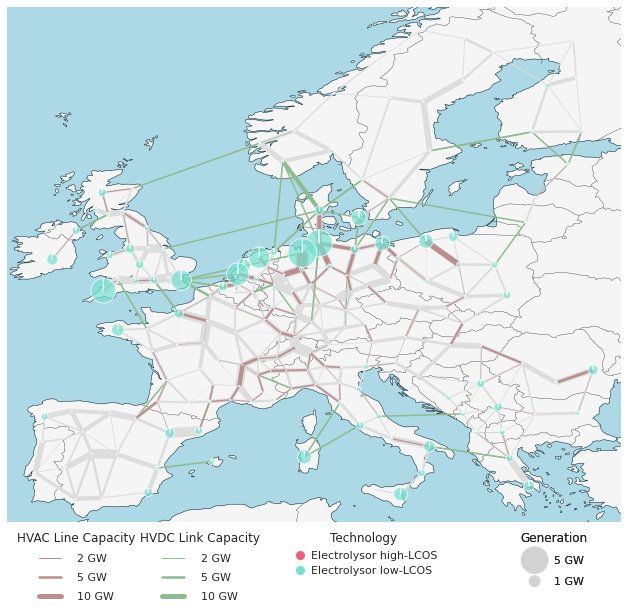

In [75]:
plot_network(n2elec, fn=None)

## Fuel cell

In [76]:
# Upload scneario 2 - Storage defined by store and links
n = pypsa.Network("/home/max/OneDrive/PHD-Flexibility/08_FirstPaper/Modelling-results-try2/Var-ratio-free-tech-chain/elec_s_181_ec_lv1.25_Co2L0.0-1H-EQ0.8c.nc")

INFO:pypsa.io:Imported network elec_s_181_ec_lv1.25_Co2L0.0-1H-EQ0.8c.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


In [77]:
#Adding new colors for plot
add_colors = pd.DataFrame([[0.000, '#f05d7c', 'Fuel cell high-LCOS'],[0.000, '#74e2d1', 'Fuel cell low-LCOS'],[0.000, '#f05d7c', 'Electrolysor high-LCOS'],[0.000, '#74e2d1', 'Electrolysor low-LCOS']], 
                          columns=['co2_emissions', 'color', 'nice_name'], 
                          index = ['H2 fuel cell-high-LCOS','H2 fuel cell-low-LCOS', 'H2 electrolysis-high-LCOS','H2 electrolysis-low-LCOS'])
#['H2 fuel cell-high-LCOS','H2 fuel cell-low-LCOS']
#['H2 electrolysis-high-LCOS','H2 electrolysis-low-LCOS']

In [78]:
#Check here if concat(adding new rows) is correct
n.carriers = pd.concat([n.carriers,add_colors])

In [79]:
n.carriers.at['H2-scenario-h-LCOS', 'color'] = '#141414'
n.carriers.at['H2-scenario-l-LCOS', 'color'] = '#ff9000'
n.carriers.at['H2 fuel cell-high-LCOS','color'] = '#f05d7c' #'#a84156' #dark red
n.carriers.at['H2 fuel cell-low-LCOS', 'color'] = '#74e2d1' #'#519e92' #dark green 
n.carriers.at['H2 electrolysis-high-LCOS', 'color'] = '#f05d7c' #light red
n.carriers.at['H2 electrolysis-low-LCOS', 'color'] = '#74e2d1' #light green

In [80]:
#filters only storage components
storage_comp = n.links.iloc[42:]
storage_comp.apply(lambda x: x)
storage_comp

,bus0,bus1,carrier,geometry,length,p_nom,tags,under_construction,underground,p_min_pu,underwater_fraction,capital_cost,efficiency,p_nom_extendable,p_nom_min,p_nom_opt,charger_ratio,type,p_nom_max,p_set,p_max_pu,marginal_cost,terrain_factor
name,,,,,,,,,,,,,,,,,,,,,,,
AL0 0 H2-scenario Electrolysis-high-LCOS,AL0 0,AL0 0 H2-scenario,H2 electrolysis-high-LCOS,,0.0,0.0,,NaN,NaN,0.0,NaN,94221.577048,0.790,True,0.0,1.871557,NaN,,inf,0.0,1.0,0.0,1.0
AT0 0 H2-scenario Electrolysis-high-LCOS,AT0 0,AT0 0 H2-scenario,H2 electrolysis-high-LCOS,,0.0,0.0,,NaN,NaN,0.0,NaN,94221.577048,0.790,True,0.0,1.217640,NaN,,inf,0.0,1.0,0.0,1.0
AT0 1 H2-scenario Electrolysis-high-LCOS,AT0 1,AT0 1 H2-scenario,H2 electrolysis-high-LCOS,,0.0,0.0,,NaN,NaN,0.0,NaN,94221.577048,0.790,True,0.0,2.307265,NaN,,inf,0.0,1.0,0.0,1.0
AT0 2 H2-scenario Electrolysis-high-LCOS,AT0 2,AT0 2 H2-scenario,H2 electrolysis-high-LCOS,,0.0,0.0,,NaN,NaN,0.0,NaN,94221.577048,0.790,True,0.0,1.597181,NaN,,inf,0.0,1.0,0.0,1.0
BA0 0 H2-scenario Electrolysis-high-LCOS,BA0 0,BA0 0 H2-scenario,H2 electrolysis-high-LCOS,,0.0,0.0,,NaN,NaN,0.0,NaN,94221.577048,0.790,True,0.0,2.017002,NaN,,inf,0.0,1.0,0.0,1.0
BE0 0 H2-scenario Electrolysis-high-LCOS,BE0 0,BE0 0 H2-scenario,H2 electrolysis-high-LCOS,,0.0,0.0,,NaN,NaN,0.0,NaN,94221.577048,0.790,True,0.0,2.371404,NaN,,inf,0.0,1.0,0.0,1.0
BE0 1 H2-scenario Electrolysis-high-LCOS,BE0 1,BE0 1 H2-scenario,H2 electrolysis-high-LCOS,,0.0,0.0,,NaN,NaN,0.0,NaN,94221.577048,0.790,True,0.0,2.041993,NaN,,inf,0.0,1.0,0.0,1.0
BE0 2 H2-scenario Electrolysis-high-LCOS,BE0 2,BE0 2 H2-scenario,H2 electrolysis-high-LCOS,,0.0,0.0,,NaN,NaN,0.0,NaN,94221.577048,0.790,True,0.0,2.013294,NaN,,inf,0.0,1.0,0.0,1.0
BE0 3 H2-scenario Electrolysis-high-LCOS,BE0 3,BE0 3 H2-scenario,H2 electrolysis-high-LCOS,,0.0,0.0,,NaN,NaN,0.0,NaN,94221.577048,0.790,True,0.0,1.998736,NaN,,inf,0.0,1.0,0.0,1.0


In [81]:
###map.py von Fabian
"""
Network expansion plotting functions.
"""

__author__ = "Fabian Neumann (KIT)"
__copyright__ = "Copyright 2019-2020 Fabian Neumann (KIT), GNU GPL 3"

import pandas as pd
import numpy as np

import cartopy.crs as ccrs
import matplotlib.pyplot as plt

from matplotlib.patches import Circle, Ellipse
from matplotlib.legend_handler import HandlerPatch




def make_handler_map_to_scale_circles_as_in(ax, dont_resize_actively=False):
    fig = ax.get_figure()

    def axes2pt():
        return np.diff(ax.transData.transform([(0, 0), (1, 1)]), axis=0)[0] * (
            300.0 / fig.dpi
        )

    ellipses = []
    if not dont_resize_actively:

        def update_width_height(event):
            dist = axes2pt()
            for e, radius in ellipses:
                e.width, e.height = 2.0 * radius * dist

        fig.canvas.mpl_connect("resize_event", update_width_height)
        ax.callbacks.connect("xlim_changed", update_width_height)
        ax.callbacks.connect("ylim_changed", update_width_height)

    def legend_circle_handler(
        legend, orig_handle, xdescent, ydescent, width, height, fontsize
    ):
        w, h = 2.0 * orig_handle.get_radius() * axes2pt()
        e = Ellipse(
            xy=(0.5 * width - 0.5 * xdescent, 0.5 * height - 0.5 * ydescent),
            width=w,
            height=w,
        )
        ellipses.append((e, orig_handle.get_radius()))
        return e

    return {Circle: HandlerPatch(patch_func=legend_circle_handler)}


def make_legend_circles_for(sizes, scale=1.0, **kw):
    return [Circle((0, 0), radius=(s / scale) ** 0.5, **kw) for s in sizes]


def add_legend(ax, bus_factor, branch_factor):

    handles = []
    labels = []
    for s in (2, 5, 10):
        handles.append(
            plt.Line2D([0], [0], color="rosybrown", linewidth=s * 1e3 / branch_factor)
        )
        labels.append(f"{s} GW")
    l1 = ax.legend(
        handles,
        labels,
        loc="upper left",
        bbox_to_anchor=(0, 0),
        frameon=False,
        labelspacing=0.8,
        handletextpad=1.5,
        title="HVAC Line Capacity",
    )
    ax.add_artist(l1)

    handles = []
    labels = []
    for s in (2, 5, 10):
        handles.append(
            plt.Line2D(
                [0], [0], color="darkseagreen", linewidth=s * 1e3 / branch_factor
            )
        )
        labels.append(f"{s} GW")
    l2 = ax.legend(
        handles,
        labels,
        loc="upper left",
        bbox_to_anchor=(0.2, -0.0),
        frameon=False,
        labelspacing=0.8,
        handletextpad=1.5,
        title="HVDC Link Capacity",
    )
    ax.add_artist(l2)

    handles = []
    labels = []
    ##########
    n.carriers = n.carriers.loc[[
               'H2 fuel cell-high-LCOS',
               'H2 fuel cell-low-LCOS']]
    if "Load" in n.carriers.index:
        n.carriers = n.carriers.drop("Load")
    for name, carrier in n.carriers.iterrows():
        handles.append(
            plt.Line2D(
                [0], [0], color=carrier.color, marker="o", markersize=8, linewidth=0
            )
        )
        labels.append(carrier.nice_name)
    l3 = ax.legend(
        handles,
        labels,
        loc="upper center",
        bbox_to_anchor=(0.58, -0.0),  # bbox_to_anchor=(0.72, -0.05),
        handletextpad=0.0,
        columnspacing=0.5,
        ncol=1,
        title="Technology",
        frameon=False,
    )
    ax.add_artist(l3)

    circles = [500, 100]
    handles = make_legend_circles_for(circles, scale=bus_factor, facecolor="lightgray")
    labels = [f"{int(s/1e2)} GW" for s in circles]
    l4 = ax.legend(
        handles,
        labels,
        loc="upper left",
        bbox_to_anchor=(0.82, 0.0),
        frameon=False,
        labelspacing=1,
        title="Generation",
        handler_map=make_handler_map_to_scale_circles_as_in(ax, True),
    )
    ax.add_artist(l4)


def plot_network(n, fn=None):

    bus_factor = 1e4
    branch_factor = 2e3

    fields = ["bus0", "carrier", "p_nom_opt"]
    pie_components = storage_comp.loc[storage_comp['carrier'].apply(lambda x: x in ['H2 fuel cell-low-LCOS', 'H2 fuel cell-high-LCOS'])].iloc[:,:]
    bus_sizes = pie_components.groupby(["bus1", "carrier"]).p_nom_opt.sum() / bus_factor

    def clip(df, thres=500):
        return df.where(df > thres, other=0.0)

    line_widths = clip(n.lines.s_nom_opt - n.lines.s_nom) / branch_factor
    link_widths = clip(n.links.p_nom_opt - n.links.p_nom) / branch_factor
    line_widths_opt = clip(n.lines.s_nom_opt) / branch_factor

    fig, ax = plt.subplots(
        figsize=(11, 11), subplot_kw={"projection": ccrs.PlateCarree()}
    )

    n.plot(
        ax=ax,
        bus_sizes=bus_sizes,
        color_geomap=True,
        bus_alpha=0.7,
        line_widths=line_widths_opt,
        line_colors="#dddddd",
    )

    n.plot(
        ax=ax,
        geomap=False,
        bus_sizes=0,
        line_widths=line_widths,
        link_widths=link_widths,
    )

    add_legend(ax, bus_factor, branch_factor)

    if fn is not None:
        plt.savefig(fn, bbox_inches="tight")
        
        
        


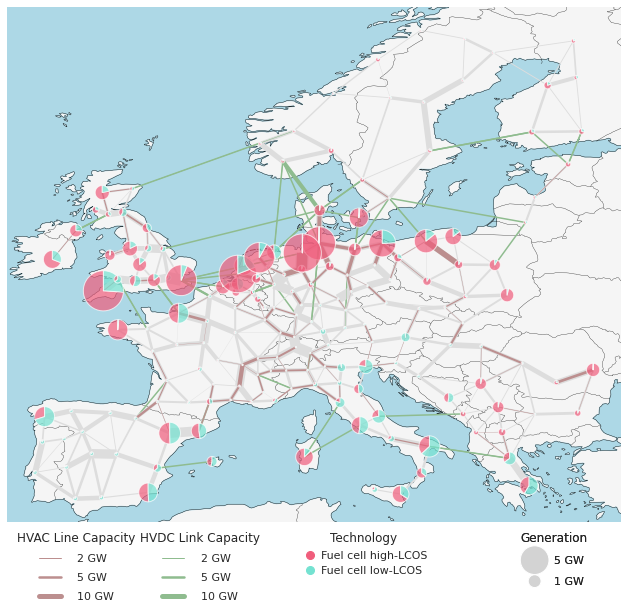

In [82]:
plot_network(n, fn=None)

## H2 storage

In [83]:
# Upload scneario 2 - Storage defined by store and links
n = pypsa.Network("/home/max/OneDrive/PHD-Flexibility/08_FirstPaper/Modelling-results-try2/Var-ratio-free-tech-chain/elec_s_181_ec_lv1.25_Co2L0.0-1H-EQ0.8c.nc")

INFO:pypsa.io:Imported network elec_s_181_ec_lv1.25_Co2L0.0-1H-EQ0.8c.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


In [84]:
n.carriers.at['H2-scenario', 'color'] = '#f05d7c' #light red
n.carriers.at['H2-scenario', 'nice_name'] = 'H2 storage' #light red

In [85]:
n.carriers

,co2_emissions,color,nice_name
name,,,
biomass,0.000,#0c6013,
geothermal,0.026,#ba91b1,
nuclear,0.000,#ff9000,
onwind,0.000,#235ebc,Onshore Wind
offwind-ac,0.000,#6895dd,Offshore Wind (AC)
offwind-dc,0.000,#74c6f2,Offshore Wind (DC)
solar,0.000,#f9d002,Solar
PHS,0.000,#08ad97,Pumped Hydro Storage
hydro,0.000,#08ad97,Reservoir & Dam


In [86]:
###map.py von Fabian
"""
Network expansion plotting functions.
"""

__author__ = "Fabian Neumann (KIT)"
__copyright__ = "Copyright 2019-2020 Fabian Neumann (KIT), GNU GPL 3"

import pandas as pd
import numpy as np

import cartopy.crs as ccrs
import matplotlib.pyplot as plt

from matplotlib.patches import Circle, Ellipse
from matplotlib.legend_handler import HandlerPatch




def make_handler_map_to_scale_circles_as_in(ax, dont_resize_actively=False):
    fig = ax.get_figure()

    def axes2pt():
        return np.diff(ax.transData.transform([(0, 0), (1, 1)]), axis=0)[0] * (
            300.0 / fig.dpi
        )

    ellipses = []
    if not dont_resize_actively:

        def update_width_height(event):
            dist = axes2pt()
            for e, radius in ellipses:
                e.width, e.height = 2.0 * radius * dist

        fig.canvas.mpl_connect("resize_event", update_width_height)
        ax.callbacks.connect("xlim_changed", update_width_height)
        ax.callbacks.connect("ylim_changed", update_width_height)

    def legend_circle_handler(
        legend, orig_handle, xdescent, ydescent, width, height, fontsize
    ):
        w, h = 2.0 * orig_handle.get_radius() * axes2pt()
        e = Ellipse(
            xy=(0.5 * width - 0.5 * xdescent, 0.5 * height - 0.5 * ydescent),
            width=w,
            height=w,
        )
        ellipses.append((e, orig_handle.get_radius()))
        return e

    return {Circle: HandlerPatch(patch_func=legend_circle_handler)}


def make_legend_circles_for(sizes, scale=1.0, **kw):
    return [Circle((0, 0), radius=(s / scale) ** 0.5, **kw) for s in sizes]


def add_legend(ax, bus_factor, branch_factor):

    handles = []
    labels = []
    for s in (2, 5, 10):
        handles.append(
            plt.Line2D([0], [0], color="rosybrown", linewidth=s * 1e3 / branch_factor)
        )
        labels.append(f"{s} GW")
    l1 = ax.legend(
        handles,
        labels,
        loc="upper left",
        bbox_to_anchor=(0, 0),
        frameon=False,
        labelspacing=0.8,
        handletextpad=1.5,
        title="HVAC Line Capacity",
    )
    ax.add_artist(l1)

    handles = []
    labels = []
    for s in (2, 5, 10):
        handles.append(
            plt.Line2D(
                [0], [0], color="darkseagreen", linewidth=s * 1e3 / branch_factor
            )
        )
        labels.append(f"{s} GW")
    l2 = ax.legend(
        handles,
        labels,
        loc="upper left",
        bbox_to_anchor=(0.2, -0.0),
        frameon=False,
        labelspacing=0.8,
        handletextpad=1.5,
        title="HVDC Link Capacity",
    )
    ax.add_artist(l2)

    handles = []
    labels = []
    ##########
    n.carriers = n.carriers.loc[['H2-scenario']]
    if "Load" in n.carriers.index:
        n.carriers = n.carriers.drop("Load")
    for name, carrier in n.carriers.iterrows():
        handles.append(
            plt.Line2D(
                [0], [0], color=carrier.color, marker="o", markersize=8, linewidth=0
            )
        )
        labels.append(carrier.nice_name)
    l3 = ax.legend(
        handles,
        labels,
        loc="upper center",
        bbox_to_anchor=(0.58, -0.0),  # bbox_to_anchor=(0.72, -0.05),
        handletextpad=0.0,
        columnspacing=0.5,
        ncol=1,
        title="Technology",
        frameon=False,
    )
    ax.add_artist(l3)

    circles = [50000, 10000]
    handles = make_legend_circles_for(circles, scale=bus_factor, facecolor="lightgray")
    labels = [f"{int(s/1e2)} GW" for s in circles]
    l4 = ax.legend(
        handles,
        labels,
        loc="upper left",
        bbox_to_anchor=(0.82, 0.0),
        frameon=False,
        labelspacing=1,
        title="Generation",
        handler_map=make_handler_map_to_scale_circles_as_in(ax, True),
    )
    ax.add_artist(l4)


def plot_network(n, fn=None):

    bus_factor = 1e6
    branch_factor = 2e3

    fields = ["bus0", "carrier", "p_nom_opt"]
    pie_components = n.stores.loc[n.stores['carrier'].apply(lambda x: x in ['H2-scenario'])].iloc[:,:]
    bus_sizes = pie_components.groupby(["bus", "carrier"]).e_nom_opt.sum() / bus_factor

    def clip(df, thres=500):
        return df.where(df > thres, other=0.0)

    line_widths = clip(n.lines.s_nom_opt - n.lines.s_nom) / branch_factor
    link_widths = clip(n.links.p_nom_opt - n.links.p_nom) / branch_factor
    line_widths_opt = clip(n.lines.s_nom_opt) / branch_factor

    fig, ax = plt.subplots(
        figsize=(11, 11), subplot_kw={"projection": ccrs.PlateCarree()}
    )

    n.plot(
        ax=ax,
        bus_sizes=bus_sizes,
        color_geomap=True,
        bus_alpha=0.7,
        line_widths=line_widths_opt,
        line_colors="#dddddd",
    )

    n.plot(
        ax=ax,
        geomap=False,
        bus_sizes=0,
        line_widths=line_widths,
        link_widths=link_widths,
    )

    add_legend(ax, bus_factor, branch_factor)

    if fn is not None:
        plt.savefig(fn, bbox_inches="tight")
        
        
        


In [87]:
hi = n.stores.loc[n.stores['carrier'].apply(lambda x: x in ['H2-scenario'])].iloc[:,:]
hi.groupby(["bus", "carrier"]).e_nom_opt.sum().sum()
#n.carriers

13622586.877435587

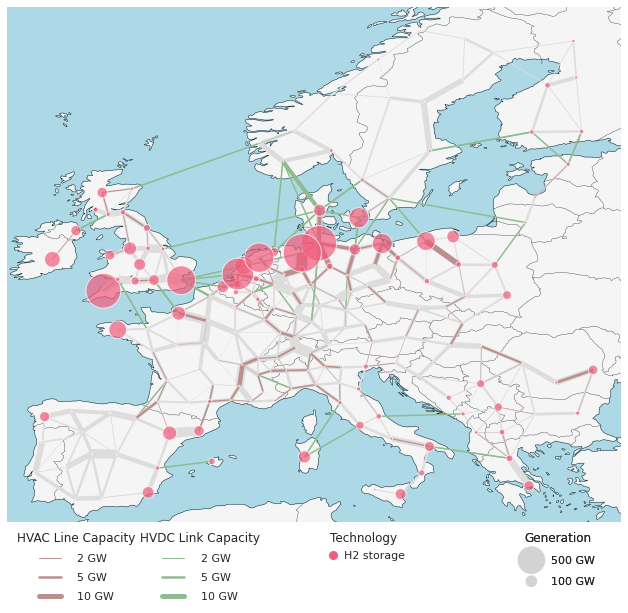

In [88]:
plot_network(n, fn=None)

# Improved low LCOS calculation

In [89]:
# LCOS = capital_cost / total_discharge_amount + charging_cost / total_discharge_amount

In [90]:
# CAPEX = capital_cost(€/MW)*p.nom.max(MW)

In [91]:
# total_discharge_amount = p.dispatch.sum[MWh]*dispatch_efficiency

In [92]:
#WAY1 charging_cost = Energy_out*effi_RT*el_price ((BUT WHAT IS THE ELECTRICITY PRICE))

In [93]:
#WAY2 charging_cost = Energy_in*el_price

CAPEX-calculation: [€/year]

In [94]:
# CAPEX = capital_cost(€/MW)*p.nom.max(MW)

In [95]:
storage_comp = n.links.iloc[42:]
storage_comp

,bus0,bus1,carrier,geometry,length,p_nom,tags,under_construction,underground,p_min_pu,underwater_fraction,capital_cost,efficiency,p_nom_extendable,p_nom_min,p_nom_opt,charger_ratio,type,p_nom_max,p_set,p_max_pu,marginal_cost,terrain_factor
name,,,,,,,,,,,,,,,,,,,,,,,
AL0 0 H2-scenario Electrolysis-high-LCOS,AL0 0,AL0 0 H2-scenario,H2 electrolysis-high-LCOS,,0.0,0.0,,NaN,NaN,0.0,NaN,94221.577048,0.790,True,0.0,1.871557,NaN,,inf,0.0,1.0,0.0,1.0
AT0 0 H2-scenario Electrolysis-high-LCOS,AT0 0,AT0 0 H2-scenario,H2 electrolysis-high-LCOS,,0.0,0.0,,NaN,NaN,0.0,NaN,94221.577048,0.790,True,0.0,1.217640,NaN,,inf,0.0,1.0,0.0,1.0
AT0 1 H2-scenario Electrolysis-high-LCOS,AT0 1,AT0 1 H2-scenario,H2 electrolysis-high-LCOS,,0.0,0.0,,NaN,NaN,0.0,NaN,94221.577048,0.790,True,0.0,2.307265,NaN,,inf,0.0,1.0,0.0,1.0
AT0 2 H2-scenario Electrolysis-high-LCOS,AT0 2,AT0 2 H2-scenario,H2 electrolysis-high-LCOS,,0.0,0.0,,NaN,NaN,0.0,NaN,94221.577048,0.790,True,0.0,1.597181,NaN,,inf,0.0,1.0,0.0,1.0
BA0 0 H2-scenario Electrolysis-high-LCOS,BA0 0,BA0 0 H2-scenario,H2 electrolysis-high-LCOS,,0.0,0.0,,NaN,NaN,0.0,NaN,94221.577048,0.790,True,0.0,2.017002,NaN,,inf,0.0,1.0,0.0,1.0
BE0 0 H2-scenario Electrolysis-high-LCOS,BE0 0,BE0 0 H2-scenario,H2 electrolysis-high-LCOS,,0.0,0.0,,NaN,NaN,0.0,NaN,94221.577048,0.790,True,0.0,2.371404,NaN,,inf,0.0,1.0,0.0,1.0
BE0 1 H2-scenario Electrolysis-high-LCOS,BE0 1,BE0 1 H2-scenario,H2 electrolysis-high-LCOS,,0.0,0.0,,NaN,NaN,0.0,NaN,94221.577048,0.790,True,0.0,2.041993,NaN,,inf,0.0,1.0,0.0,1.0
BE0 2 H2-scenario Electrolysis-high-LCOS,BE0 2,BE0 2 H2-scenario,H2 electrolysis-high-LCOS,,0.0,0.0,,NaN,NaN,0.0,NaN,94221.577048,0.790,True,0.0,2.013294,NaN,,inf,0.0,1.0,0.0,1.0
BE0 3 H2-scenario Electrolysis-high-LCOS,BE0 3,BE0 3 H2-scenario,H2 electrolysis-high-LCOS,,0.0,0.0,,NaN,NaN,0.0,NaN,94221.577048,0.790,True,0.0,1.998736,NaN,,inf,0.0,1.0,0.0,1.0


In [96]:
pie_components = storage_comp.loc[storage_comp['carrier'].apply(lambda x: x in ['H2 electrolysis-low-LCOS'])].iloc[:,:]
installed_capacity_electrolysor_low_LCOS = pie_components.groupby(["bus0", "carrier"]).p_nom_opt.sum()
pie_components = storage_comp.loc[storage_comp['carrier'].apply(lambda x: x in ['H2 fuel cell-low-LCOS'])].iloc[:,:]
installed_capacity_fuel_cell_low_LCOS = pie_components.groupby(["bus1", "carrier"]).p_nom_opt.sum()
pie_components = n.stores.loc[n.stores['carrier'].apply(lambda x: x in ['H2-scenario'])].iloc[:,:]
installed_capacity_H2_storage_low_LCOS = pie_components.groupby(["bus", "carrier"]).e_nom_opt.sum()

In [97]:
installed_capacity_electrolysor_low_LCOS = installed_capacity_electrolysor_low_LCOS.reset_index(drop=True)
installed_capacity_fuel_cell_low_LCOS = installed_capacity_fuel_cell_low_LCOS.reset_index(drop=True)
installed_capacity_H2_storage_low_LCOS = installed_capacity_H2_storage_low_LCOS.reset_index(drop=True)

In [98]:
pie_components = storage_comp.loc[storage_comp['carrier'].apply(lambda x: x in ['H2 electrolysis-low-LCOS'])].iloc[:,:]
CAPEX_Fom_electrolysor_low_LCOS = pie_components.groupby(["bus0", "carrier"]).capital_cost.sum()
pie_components = storage_comp.loc[storage_comp['carrier'].apply(lambda x: x in ['H2 fuel cell-low-LCOS'])].iloc[:,:]
CAPEX_Fom_fuel_cell_low_LCOS = pie_components.groupby(["bus1", "carrier"]).capital_cost.sum()
pie_components = n.stores.loc[n.stores['carrier'].apply(lambda x: x in ['H2-scenario'])].iloc[:,:]
CAPEX_Fom_H2_storage_low_LCOS = pie_components.groupby(["bus", "carrier"]).capital_cost.sum()

In [99]:
CAPEX_Fom_electrolysor_low_LCOS = CAPEX_Fom_electrolysor_low_LCOS.reset_index(drop=True)
CAPEX_Fom_fuel_cell_low_LCOS = CAPEX_Fom_fuel_cell_low_LCOS.reset_index(drop=True)
CAPEX_Fom_H2_storage_low_LCOS = CAPEX_Fom_H2_storage_low_LCOS.reset_index(drop=True)

In [100]:
CAPEX = (installed_capacity_electrolysor_low_LCOS * CAPEX_Fom_electrolysor_low_LCOS + 
        installed_capacity_fuel_cell_low_LCOS * CAPEX_Fom_fuel_cell_low_LCOS + 
        installed_capacity_H2_storage_low_LCOS * CAPEX_Fom_H2_storage_low_LCOS)
#CAPEX  #[€/year]

Total-discharge-amount calculation: [MWh/year]

In [101]:
# total_discharge_amount = p.dispatch.sum[MWh]*dispatch_efficiency

In [162]:
costs = pd.read_csv('/home/max/OneDrive/PHD-Flexibility/08_FirstPaper/Modelling-results-try2/Var-ratio-fix-tech-chain/costs.csv')

dispatch_effi = costs.iloc[102]['value']

In [163]:
total_discharged_amount = n.links_t.p0.filter(like='H2-scenario Fuel Cell-low-LCOS', axis='columns').sum()
total_discharged_amount = total_discharged_amount*dispatch_effi
total_discharged_amount = total_discharged_amount.reset_index(drop=True)
total_discharged_amount.sum() #[MWh/year]

2061395.9740429681

Charging-cost calculcation: [€]

In [164]:
#WAY2 charging_cost = Energy_in(t)*el_price(t)

In [165]:
#costs = pd.read_csv('/home/max/OneDrive/PHD-Flexibility/08_FirstPaper/Modelling-results-try2/Var-ratio-fix-tech-chain/costs.csv')
#store_effi = costs.iloc[94]['value']
#store_effi

#### Not necessary with store and link all the efficiecies are already implemented.
## p0 (elec bus) -> p1 (storage) charging
## p0(storage) -> p1 (elec bus) discharging 

In [166]:
charging_energy = n.links_t.p0.filter(like='H2-scenario Electrolysis-low-LCOS', axis='columns')
column_index = charging_energy.transpose().index

#Loop to replace all values below 10 by "0"
for item in range(0,len(column_index)): 
    boolean_condition = charging_energy[charging_energy.transpose().index[item]] < 1
    column_name = column_index[item]
    new_value = 0
    charging_energy.loc[boolean_condition, column_name] = new_value

charging_energy.head()

/home/max/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:671: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-166-dbef384d55d9>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  charging_energy.loc[boolean_condition, column_name] = new_value


name,AL0 0 H2-scenario Electrolysis-low-LCOS,AT0 0 H2-scenario Electrolysis-low-LCOS,AT0 1 H2-scenario Electrolysis-low-LCOS,AT0 2 H2-scenario Electrolysis-low-LCOS,BA0 0 H2-scenario Electrolysis-low-LCOS,BE0 0 H2-scenario Electrolysis-low-LCOS,BE0 1 H2-scenario Electrolysis-low-LCOS,BE0 2 H2-scenario Electrolysis-low-LCOS,BE0 3 H2-scenario Electrolysis-low-LCOS,BE0 4 H2-scenario Electrolysis-low-LCOS,BG0 0 H2-scenario Electrolysis-low-LCOS,BG0 1 H2-scenario Electrolysis-low-LCOS,CH0 0 H2-scenario Electrolysis-low-LCOS,CH0 1 H2-scenario Electrolysis-low-LCOS,CH0 2 H2-scenario Electrolysis-low-LCOS,CZ0 0 H2-scenario Electrolysis-low-LCOS,CZ0 1 H2-scenario Electrolysis-low-LCOS,CZ0 2 H2-scenario Electrolysis-low-LCOS,DE0 0 H2-scenario Electrolysis-low-LCOS,DE0 1 H2-scenario Electrolysis-low-LCOS,DE0 10 H2-scenario Electrolysis-low-LCOS,DE0 11 H2-scenario Electrolysis-low-LCOS,DE0 12 H2-scenario Electrolysis-low-LCOS,DE0 13 H2-scenario Electrolysis-low-LCOS,DE0 14 H2-scenario Electrolysis-low-LCOS,DE0 15 H2-scenario Electrolysis-low-LCOS,DE0 16 H2-scenario Electrolysis-low-LCOS,DE0 17 H2-scenario Electrolysis-low-LCOS,DE0 18 H2-scenario Electrolysis-low-LCOS,DE0 19 H2-scenario Electrolysis-low-LCOS,DE0 2 H2-scenario Electrolysis-low-LCOS,DE0 20 H2-scenario Electrolysis-low-LCOS,DE0 21 H2-scenario Electrolysis-low-LCOS,DE0 22 H2-scenario Electrolysis-low-LCOS,DE0 23 H2-scenario Electrolysis-low-LCOS,DE0 24 H2-scenario Electrolysis-low-LCOS,DE0 25 H2-scenario Electrolysis-low-LCOS,DE0 3 H2-scenario Electrolysis-low-LCOS,DE0 4 H2-scenario Electrolysis-low-LCOS,DE0 5 H2-scenario Electrolysis-low-LCOS,DE0 6 H2-scenario Electrolysis-low-LCOS,DE0 7 H2-scenario Electrolysis-low-LCOS,DE0 8 H2-scenario Electrolysis-low-LCOS,DE0 9 H2-scenario Electrolysis-low-LCOS,DK0 0 H2-scenario Electrolysis-low-LCOS,DK3 0 H2-scenario Electrolysis-low-LCOS,EE6 0 H2-scenario Electrolysis-low-LCOS,ES0 0 H2-scenario Electrolysis-low-LCOS,ES0 1 H2-scenario Electrolysis-low-LCOS,ES0 10 H2-scenario Electrolysis-low-LCOS,ES0 11 H2-scenario Electrolysis-low-LCOS,ES0 12 H2-scenario Electrolysis-low-LCOS,ES0 13 H2-scenario Electrolysis-low-LCOS,ES0 2 H2-scenario Electrolysis-low-LCOS,ES0 3 H2-scenario Electrolysis-low-LCOS,ES0 4 H2-scenario Electrolysis-low-LCOS,ES0 5 H2-scenario Electrolysis-low-LCOS,ES0 6 H2-scenario Electrolysis-low-LCOS,ES0 7 H2-scenario Electrolysis-low-LCOS,ES0 8 H2-scenario Electrolysis-low-LCOS,ES0 9 H2-scenario Electrolysis-low-LCOS,ES2 0 H2-scenario Electrolysis-low-LCOS,FI3 0 H2-scenario Electrolysis-low-LCOS,FI3 1 H2-scenario Electrolysis-low-LCOS,FI3 2 H2-scenario Electrolysis-low-LCOS,FI3 3 H2-scenario Electrolysis-low-LCOS,FI3 4 H2-scenario Electrolysis-low-LCOS,FR0 0 H2-scenario Electrolysis-low-LCOS,FR0 1 H2-scenario Electrolysis-low-LCOS,FR0 10 H2-scenario Electrolysis-low-LCOS,FR0 11 H2-scenario Electrolysis-low-LCOS,FR0 12 H2-scenario Electrolysis-low-LCOS,FR0 13 H2-scenario Electrolysis-low-LCOS,FR0 14 H2-scenario Electrolysis-low-LCOS,FR0 15 H2-scenario Electrolysis-low-LCOS,FR0 16 H2-scenario Electrolysis-low-LCOS,FR0 17 H2-scenario Electrolysis-low-LCOS,FR0 18 H2-scenario Electrolysis-low-LCOS,FR0 19 H2-scenario Electrolysis-low-LCOS,FR0 2 H2-scenario Electrolysis-low-LCOS,FR0 20 H2-scenario Electrolysis-low-LCOS,FR0 21 H2-scenario Electrolysis-low-LCOS,FR0 22 H2-scenario Electrolysis-low-LCOS,FR0 23 H2-scenario Electrolysis-low-LCOS,FR0 24 H2-scenario Electrolysis-low-LCOS,FR0 25 H2-scenario Electrolysis-low-LCOS,FR0 26 H2-scenario Electrolysis-low-LCOS,FR0 27 H2-scenario Electrolysis-low-LCOS,FR0 3 H2-scenario Electrolysis-low-LCOS,FR0 4 H2-scenario Electrolysis-low-LCOS,FR0 5 H2-scenario Electrolysis-low-LCOS,FR0 6 H2-scenario Electrolysis-low-LCOS,FR0 7 H2-scenario Electrolysis-low-LCOS,FR0 8 H2-scenario Electrolysis-low-LCOS,FR0 9 H2-scenario Electrolysis-low-LCOS,GB4 0 H2-scenario Electrolysis-low-LCOS,GB5 0 H2-scenario Electrolysis-low-LCOS,GB5 1 H2-scenario Electrolysis-low-LCOS,GB5 10 H2-scenario Electrolysis-low-L

In [167]:
elec_price = n.buses_t.marginal_price.iloc[:,0:len(column_index)]
#elec_price.head()

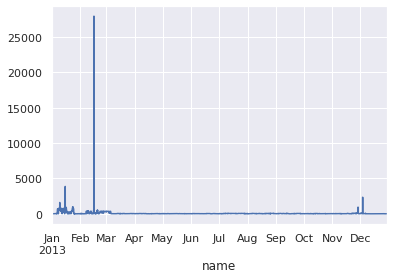

In [168]:
#Understanding why the LCOS is so high
elec_price['GB4 0'].loc[n.snapshots[0]:n.snapshots[8700]].plot()
#elec_price.max()

In [169]:
elec_price = elec_price.reset_index(drop=True) ##clears row index
elec_price = elec_price.transpose().reset_index(drop=True) ##clear column index
elec_price = elec_price.transpose() #transpose back to original shape

charging_energy = charging_energy.reset_index(drop=True) ##clears row index
charging_energy = charging_energy.transpose().reset_index(drop=True) ##clear column index
charging_energy = charging_energy.transpose() #transpose back to original shape

charging_cost = charging_energy.loc[:] * elec_price.loc[:]  # charging cost per bus with time information
charging_cost = charging_cost.sum() # charging cost per bus
charging_cost.head()

0    8.224187e+06
1    1.734286e+05
2    1.802825e+06
3    3.256659e+05
4    1.681441e+07
dtype: float64

LCOS-calculation: [€/MWh]

In [170]:
LCOS_low_case = (CAPEX+charging_cost)/total_discharged_amount
CAPEX_low_LCOS = CAPEX
charging_cost_low_LCOS = charging_cost
total_discharged_amount_low_LCOS = total_discharged_amount
#LCOS_low_case

Market-size calculation: \
[MW] discharge_unit = charging_unit,  
[MWh] capacity = max_hours*discharge_unit

In [171]:
#market-size per bus
market_size_electrolysor_low_LCOS = installed_capacity_electrolysor_low_LCOS.reset_index(drop=True)
market_size_fuel_cell_low_LCOS = installed_capacity_fuel_cell_low_LCOS.reset_index(drop=True)
market_size_H2_storage_low_LCOS = installed_capacity_H2_storage_low_LCOS.reset_index(drop=True)


Full-load-hour calculation:

In [172]:
# discharged net amount per bus [MWh] / effective built discharge unit [MW]

In [173]:
nom_install_capacity = market_size_fuel_cell_low_LCOS
eff_install_capacity = market_size_fuel_cell_low_LCOS * dispatch_effi
eff_install_capacity = eff_install_capacity.reset_index(drop=True)
eff_install_capacity_low_LCOS = eff_install_capacity

In [174]:
FLH_low_LCOS = total_discharged_amount / eff_install_capacity
#FLH_low_LCOS

# Improved high LCOS calculation

In [175]:
# LCOS = capital_cost / total_discharge_amount + charging_cost / total_discharge_amount

In [176]:
# CAPEX = capital_cost(€/MW)*p.nom.max(MW)

In [177]:
# total_discharge_amount = p.dispatch.sum[MWh]*dispatch_efficiency

In [178]:
#WAY1 charging_cost = Energy_out*effi_RT*el_price ((BUT WHAT IS THE ELECTRICITY PRICE))

In [179]:
#WAY2 charging_cost = Energy_in*el_price

CAPEX-calculation: [€/year]

In [180]:
# CAPEX = capital_cost(€/MW)*p.nom.max(MW)

In [181]:
storage_comp = n.links.iloc[42:]
#storage_comp

In [182]:
pie_components = storage_comp.loc[storage_comp['carrier'].apply(lambda x: x in ['H2 electrolysis-high-LCOS'])].iloc[:,:]
installed_capacity_electrolysor_high_LCOS = pie_components.groupby(["bus0", "carrier"]).p_nom_opt.sum()
pie_components = storage_comp.loc[storage_comp['carrier'].apply(lambda x: x in ['H2 fuel cell-high-LCOS'])].iloc[:,:]
installed_capacity_fuel_cell_high_LCOS = pie_components.groupby(["bus1", "carrier"]).p_nom_opt.sum()
pie_components = n.stores.loc[n.stores['carrier'].apply(lambda x: x in ['H2-scenario'])].iloc[:,:]
installed_capacity_H2_storage_high_LCOS = pie_components.groupby(["bus", "carrier"]).e_nom_opt.sum()

In [183]:
installed_capacity_electrolysor_high_LCOS = installed_capacity_electrolysor_high_LCOS.reset_index(drop=True)
installed_capacity_fuel_cell_high_LCOS = installed_capacity_fuel_cell_high_LCOS.reset_index(drop=True)
installed_capacity_H2_storage_high_LCOS = installed_capacity_H2_storage_high_LCOS.reset_index(drop=True)

In [184]:
installed_capacity_electrolysor_high_LCOS

0      1.871557
1      1.217640
2      2.307265
3      1.597181
4      2.017002
5      2.371404
6      2.041993
7      2.013294
8      1.998736
9      1.979216
10     1.757649
11     2.011573
12     1.280127
13     1.285726
14     1.167480
15     1.657808
16     1.696359
17     1.678269
18     1.609183
19     1.846442
20     1.846107
21     1.738604
22     1.946819
23     1.610069
24     1.917826
25     1.614487
26     1.895706
27     1.412838
28     1.578628
29     1.968185
30     1.259993
31     1.664574
32     1.521827
33     1.978421
34     1.740680
35     1.598346
36     1.862105
37     1.915955
38     1.565000
39     1.541689
40     1.631233
41     2.236254
42     1.952712
43     2.005597
44     1.448723
45     1.909678
46     1.714340
47     1.603576
48     1.612818
49     1.614788
50     1.568642
51     1.624305
52     1.647619
53     1.576794
54     1.706661
55     1.858375
56     1.770618
57     1.763242
58     1.839978
59     1.582058
60     1.641108
61     1.873059
62     1

In [185]:
pie_components = storage_comp.loc[storage_comp['carrier'].apply(lambda x: x in ['H2 electrolysis-high-LCOS'])].iloc[:,:]
CAPEX_Fom_electrolysor_high_LCOS = pie_components.groupby(["bus0", "carrier"]).capital_cost.sum()
pie_components = storage_comp.loc[storage_comp['carrier'].apply(lambda x: x in ['H2 fuel cell-high-LCOS'])].iloc[:,:]
CAPEX_Fom_fuel_cell_high_LCOS = pie_components.groupby(["bus1", "carrier"]).capital_cost.sum()
pie_components = n.stores.loc[n.stores['carrier'].apply(lambda x: x in ['H2-scenario'])].iloc[:,:]
CAPEX_Fom_H2_storage_high_LCOS = pie_components.groupby(["bus", "carrier"]).capital_cost.sum()

In [186]:
CAPEX_Fom_electrolysor_high_LCOS = CAPEX_Fom_electrolysor_high_LCOS.reset_index(drop=True)
CAPEX_Fom_fuel_cell_high_LCOS = CAPEX_Fom_fuel_cell_high_LCOS.reset_index(drop=True)
CAPEX_Fom_H2_storage_high_LCOS = CAPEX_Fom_H2_storage_high_LCOS.reset_index(drop=True)

In [187]:
CAPEX = (installed_capacity_electrolysor_high_LCOS * CAPEX_Fom_electrolysor_high_LCOS + 
        installed_capacity_fuel_cell_high_LCOS * CAPEX_Fom_fuel_cell_high_LCOS + 
        installed_capacity_H2_storage_high_LCOS * CAPEX_Fom_H2_storage_high_LCOS)
#CAPEX  #[€/year]

Total-discharge-amount calculation: [MWh/year]

In [188]:
# total_discharge_amount = p.dispatch.sum[MWh]*dispatch_efficiency

In [189]:
costs = pd.read_csv('/home/max/OneDrive/PHD-Flexibility/08_FirstPaper/Modelling-results-try2/Var-ratio-fix-tech-chain/costs.csv')
dispatch_effi = costs.iloc[98]['value']

In [190]:
total_discharged_amount = n.links_t.p0.filter(like='H2-scenario Fuel Cell-high-LCOS', axis='columns').sum()
total_discharged_amount = total_discharged_amount*dispatch_effi
total_discharged_amount = total_discharged_amount.reset_index(drop=True)
total_discharged_amount.sum() #[MWh/year]


73585270.4942132

Charging-cost calculcation: [€]

In [191]:
#WAY2 charging_cost = Energy_in(t)*el_price(t)

In [192]:
#costs = pd.read_csv('/home/max/OneDrive/PHD-Flexibility/08_FirstPaper/Modelling-results-try2/Var-ratio-fix-tech-chain/costs.csv')
#store_effi = costs.iloc[94]['value']
#store_effi

#### Not necessary with store and link all the efficiecies are already implemented.
## p0 (elec bus) -> p1 (storage) charging
## p0(storage) -> p1 (elec bus) discharging 

In [193]:
charging_energy = n.links_t.p0.filter(like='H2-scenario Electrolysis-high-LCOS', axis='columns')
column_index = charging_energy.transpose().index

#Loop to replace all values below 10 by "0"
for item in range(0,len(column_index)): 
    boolean_condition = charging_energy[charging_energy.transpose().index[item]] < 1
    column_name = column_index[item]
    new_value = 0
    charging_energy.loc[boolean_condition, column_name] = new_value

charging_energy.head()

/home/max/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:671: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-193-e6ae10539885>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  charging_energy.loc[boolean_condition, column_name] = new_value


name,AL0 0 H2-scenario Electrolysis-high-LCOS,AT0 0 H2-scenario Electrolysis-high-LCOS,AT0 1 H2-scenario Electrolysis-high-LCOS,AT0 2 H2-scenario Electrolysis-high-LCOS,BA0 0 H2-scenario Electrolysis-high-LCOS,BE0 0 H2-scenario Electrolysis-high-LCOS,BE0 1 H2-scenario Electrolysis-high-LCOS,BE0 2 H2-scenario Electrolysis-high-LCOS,BE0 3 H2-scenario Electrolysis-high-LCOS,BE0 4 H2-scenario Electrolysis-high-LCOS,BG0 0 H2-scenario Electrolysis-high-LCOS,BG0 1 H2-scenario Electrolysis-high-LCOS,CH0 0 H2-scenario Electrolysis-high-LCOS,CH0 1 H2-scenario Electrolysis-high-LCOS,CH0 2 H2-scenario Electrolysis-high-LCOS,CZ0 0 H2-scenario Electrolysis-high-LCOS,CZ0 1 H2-scenario Electrolysis-high-LCOS,CZ0 2 H2-scenario Electrolysis-high-LCOS,DE0 0 H2-scenario Electrolysis-high-LCOS,DE0 1 H2-scenario Electrolysis-high-LCOS,DE0 10 H2-scenario Electrolysis-high-LCOS,DE0 11 H2-scenario Electrolysis-high-LCOS,DE0 12 H2-scenario Electrolysis-high-LCOS,DE0 13 H2-scenario Electrolysis-high-LCOS,DE0 14 H2-scenario Electrolysis-high-LCOS,DE0 15 H2-scenario Electrolysis-high-LCOS,DE0 16 H2-scenario Electrolysis-high-LCOS,DE0 17 H2-scenario Electrolysis-high-LCOS,DE0 18 H2-scenario Electrolysis-high-LCOS,DE0 19 H2-scenario Electrolysis-high-LCOS,DE0 2 H2-scenario Electrolysis-high-LCOS,DE0 20 H2-scenario Electrolysis-high-LCOS,DE0 21 H2-scenario Electrolysis-high-LCOS,DE0 22 H2-scenario Electrolysis-high-LCOS,DE0 23 H2-scenario Electrolysis-high-LCOS,DE0 24 H2-scenario Electrolysis-high-LCOS,DE0 25 H2-scenario Electrolysis-high-LCOS,DE0 3 H2-scenario Electrolysis-high-LCOS,DE0 4 H2-scenario Electrolysis-high-LCOS,DE0 5 H2-scenario Electrolysis-high-LCOS,DE0 6 H2-scenario Electrolysis-high-LCOS,DE0 7 H2-scenario Electrolysis-high-LCOS,DE0 8 H2-scenario Electrolysis-high-LCOS,DE0 9 H2-scenario Electrolysis-high-LCOS,DK0 0 H2-scenario Electrolysis-high-LCOS,DK3 0 H2-scenario Electrolysis-high-LCOS,EE6 0 H2-scenario Electrolysis-high-LCOS,ES0 0 H2-scenario Electrolysis-high-LCOS,ES0 1 H2-scenario Electrolysis-high-LCOS,ES0 10 H2-scenario Electrolysis-high-LCOS,ES0 11 H2-scenario Electrolysis-high-LCOS,ES0 12 H2-scenario Electrolysis-high-LCOS,ES0 13 H2-scenario Electrolysis-high-LCOS,ES0 2 H2-scenario Electrolysis-high-LCOS,ES0 3 H2-scenario Electrolysis-high-LCOS,ES0 4 H2-scenario Electrolysis-high-LCOS,ES0 5 H2-scenario Electrolysis-high-LCOS,ES0 6 H2-scenario Electrolysis-high-LCOS,ES0 7 H2-scenario Electrolysis-high-LCOS,ES0 8 H2-scenario Electrolysis-high-LCOS,ES0 9 H2-scenario Electrolysis-high-LCOS,ES2 0 H2-scenario Electrolysis-high-LCOS,FI3 0 H2-scenario Electrolysis-high-LCOS,FI3 1 H2-scenario Electrolysis-high-LCOS,FI3 2 H2-scenario Electrolysis-high-LCOS,FI3 3 H2-scenario Electrolysis-high-LCOS,FI3 4 H2-scenario Electrolysis-high-LCOS,FR0 0 H2-scenario Electrolysis-high-LCOS,FR0 1 H2-scenario Electrolysis-high-LCOS,FR0 10 H2-scenario Electrolysis-high-LCOS,FR0 11 H2-scenario Electrolysis-high-LCOS,FR0 12 H2-scenario Electrolysis-high-LCOS,FR0 13 H2-scenario Electrolysis-high-LCOS,FR0 14 H2-scenario Electrolysis-high-LCOS,FR0 15 H2-scenario Electrolysis-high-LCOS,FR0 16 H2-scenario Electrolysis-high-LCOS,FR0 17 H2-scenario Electrolysis-high-LCOS,FR0 18 H2-scenario Electrolysis-high-LCOS,FR0 19 H2-scenario Electrolysis-high-LCOS,FR0 2 H2-scenario Electrolysis-high-LCOS,FR0 20 H2-scenario Electrolysis-high-LCOS,FR0 21 H2-scenario Electrolysis-high-LCOS,FR0 22 H2-scenario Electrolysis-high-LCOS,FR0 23 H2-scenario Electrolysis-high-LCOS,FR0 24 H2-scenario Electrolysis-high-LCOS,FR0 25 H2-scenario Electrolysis-high-LCOS,FR0 26 H2-scenario Electrolysis-high-LCOS,FR0 27 H2-scenario Electrolysis-high-LCOS,FR0 3 H2-scenario Electrolysis-high-LCOS,FR0 4 H2-scenario Electrolysis-high-LCOS,FR0 5 H2-scenario Electrolysis-high-LCOS,FR0 6 H2-scenario Electrolysis-high-LCOS,FR0 7 H2-scenario Electrolysis-high-LCOS,FR0 8 H2-scenario Electrolysis-high-LCOS,FR0 9 H2-scenario Electrolysis-high-LCOS,GB4 0 H2-scenario Electrolysis-high-LCOS,GB5 0 H2-scenario Ele

In [194]:
elec_price = n.buses_t.marginal_price.iloc[:,0:len(column_index)]
#elec_price.head()

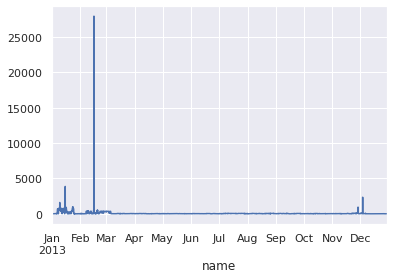

In [195]:
#Understanding why the LCOS is so high
elec_price['GB4 0'].loc[n.snapshots[0]:n.snapshots[8700]].plot()
#elec_price.max()

In [196]:
elec_price = elec_price.reset_index(drop=True) ##clears row index
elec_price = elec_price.transpose().reset_index(drop=True) ##clear column index
elec_price = elec_price.transpose() #transpose back to original shape

charging_energy = charging_energy.reset_index(drop=True) ##clears row index
charging_energy = charging_energy.transpose().reset_index(drop=True) ##clear column index
charging_energy = charging_energy.transpose() #transpose back to original shape

charging_cost = charging_energy.loc[:] * elec_price.loc[:]  # charging cost per bus with time information
charging_cost = charging_cost.sum() # charging cost per bus
charging_cost.head()


0    155340.566200
1     75644.260683
2    273806.199050
3    148072.403935
4    185820.257343
dtype: float64

LCOS-calculation: [€/MWh]

In [197]:
LCOS_high_case = (CAPEX+charging_cost)/total_discharged_amount
CAPEX_high_LCOS = CAPEX
charging_cost_high_LCOS = charging_cost
total_discharged_amount_high_LCOS = total_discharged_amount
#LCOS_low_case

Market-size calculation: \
[MW] discharge_unit = charging_unit,  
[MWh] capacity = max_hours*discharge_unit

In [198]:
#market-size per bus
market_size_electrolysor_high_LCOS = installed_capacity_electrolysor_high_LCOS.reset_index(drop=True)
market_size_fuel_cell_high_LCOS = installed_capacity_fuel_cell_high_LCOS.reset_index(drop=True)
market_size_H2_storage_high_LCOS = installed_capacity_H2_storage_high_LCOS.reset_index(drop=True)


Full-load-hour calculation:

In [199]:
# discharged net amount per bus [MWh] / effective built discharge unit [MW]

In [200]:
nom_install_capacity = market_size_fuel_cell_high_LCOS
eff_install_capacity = market_size_fuel_cell_high_LCOS * dispatch_effi
eff_install_capacity = eff_install_capacity.reset_index(drop=True)
eff_install_capacity_high_LCOS = eff_install_capacity

In [201]:
FLH_high_LCOS = total_discharged_amount / eff_install_capacity
#FLH_low_LCOS

# Improved Battery LCOS calculation

In [202]:
# LCOS = capital_cost / total_discharge_amount + charging_cost / total_discharge_amount

In [203]:
# CAPEX = capital_cost(€/MW)*p.nom.max(MW)

In [204]:
# total_discharge_amount = p.dispatch.sum[MWh]*dispatch_efficiency

In [205]:
#WAY1 charging_cost = Energy_out*effi_RT*el_price ((BUT WHAT IS THE ELECTRICITY PRICE))

In [206]:
#WAY2 charging_cost = Energy_in*el_price

CAPEX-calculation: [€/year]

In [207]:
# CAPEX = capital_cost(€/MW)*p.nom.max(MW)

In [208]:
pie_components = storage_comp.loc[storage_comp['carrier'].apply(lambda x: x in ['battery discharger'])].iloc[:,:]
installed_capacity_inverter = pie_components.groupby(["bus0", "carrier"]).p_nom_opt.sum()
pie_components = n.stores.loc[n.stores['carrier'].apply(lambda x: x in ['battery'])].iloc[:,:]
installed_capacity_battery = pie_components.groupby(["bus", "carrier"]).e_nom_opt.sum()

In [209]:
installed_capacity_inverter = installed_capacity_inverter.reset_index(drop=True)
installed_capacity_battery = installed_capacity_battery.reset_index(drop=True)

In [210]:
pie_components = storage_comp.loc[storage_comp['carrier'].apply(lambda x: x in ['battery discharger'])].iloc[:,:]
CAPEX_Fom_inverter = pie_components.groupby(["bus0", "carrier"]).capital_cost.sum()
pie_components = n.stores.loc[n.stores['carrier'].apply(lambda x: x in ['battery'])].iloc[:,:]
CAPEX_Fom_battery = pie_components.groupby(["bus", "carrier"]).capital_cost.sum()

In [211]:
CAPEX_Fom_inverter = CAPEX_Fom_inverter.reset_index(drop=True)
CAPEX_Fom_battery = CAPEX_Fom_battery.reset_index(drop=True)

In [212]:
CAPEX = (installed_capacity_inverter * CAPEX_Fom_inverter +  
        installed_capacity_battery * CAPEX_Fom_battery)
#CAPEX  #[€/year]
#CAPEX

Total-discharge-amount calculation: [MWh/year]

In [213]:
# total_discharge_amount = p.dispatch.sum[MWh]*dispatch_efficiency

In [214]:
costs = pd.read_csv('/home/max/OneDrive/PHD-Flexibility/08_FirstPaper/Modelling-results-try2/Var-ratio-fix-tech-chain/costs.csv')
dispatch_effi = (costs.iloc[217]['value'])**0.5
dispatch_effi

0.9486832980505138

In [215]:
total_discharged_amount = -(n.links_t.p1.filter(like='battery discharger', axis='columns').sum())
total_discharged_amount = total_discharged_amount.reset_index(drop=True)
total_discharged_amount.sum() #[MWh/year]


5131578.203983395

Charging-cost calculcation: [€]

In [216]:
#WAY2 charging_cost = Energy_in(t)*el_price(t)

In [217]:
#costs = pd.read_csv('/home/max/OneDrive/PHD-Flexibility/08_FirstPaper/Modelling-results-try2/Var-ratio-fix-tech-chain/costs.csv')
#store_effi = costs.iloc[94]['value']
#store_effi

#### Not necessary with store and link all the efficiecies are already implemented.
## p0 (elec bus) -> p1 (storage) charging
## p0(storage) -> p1 (elec bus) discharging 

In [218]:
charging_energy = n.links_t.p0.filter(like='battery charger', axis='columns')
column_index = charging_energy.transpose().index

#Loop to replace all values below 10 by "0"
for item in range(0,len(column_index)): 
    boolean_condition = charging_energy[charging_energy.transpose().index[item]] < 1
    column_name = column_index[item]
    new_value = 0
    charging_energy.loc[boolean_condition, column_name] = new_value

charging_energy.head()

/home/max/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:671: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-218-a3536c36c9a5>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  charging_energy.loc[boolean_condition, column_name] = new_value


name,AL0 0 battery charger,AT0 0 battery charger,AT0 1 battery charger,AT0 2 battery charger,BA0 0 battery charger,BE0 0 battery charger,BE0 1 battery charger,BE0 2 battery charger,BE0 3 battery charger,BE0 4 battery charger,BG0 0 battery charger,BG0 1 battery charger,CH0 0 battery charger,CH0 1 battery charger,CH0 2 battery charger,CZ0 0 battery charger,CZ0 1 battery charger,CZ0 2 battery charger,DE0 0 battery charger,DE0 1 battery charger,DE0 10 battery charger,DE0 11 battery charger,DE0 12 battery charger,DE0 13 battery charger,DE0 14 battery charger,DE0 15 battery charger,DE0 16 battery charger,DE0 17 battery charger,DE0 18 battery charger,DE0 19 battery charger,DE0 2 battery charger,DE0 20 battery charger,DE0 21 battery charger,DE0 22 battery charger,DE0 23 battery charger,DE0 24 battery charger,DE0 25 battery charger,DE0 3 battery charger,DE0 4 battery charger,DE0 5 battery charger,DE0 6 battery charger,DE0 7 battery charger,DE0 8 battery charger,DE0 9 battery charger,DK0 0 battery charger,DK3 0 battery charger,EE6 0 battery charger,ES0 0 battery charger,ES0 1 battery charger,ES0 10 battery charger,ES0 11 battery charger,ES0 12 battery charger,ES0 13 battery charger,ES0 2 battery charger,ES0 3 battery charger,ES0 4 battery charger,ES0 5 battery charger,ES0 6 battery charger,ES0 7 battery charger,ES0 8 battery charger,ES0 9 battery charger,ES2 0 battery charger,FI3 0 battery charger,FI3 1 battery charger,FI3 2 battery charger,FI3 3 battery charger,FI3 4 battery charger,FR0 0 battery charger,FR0 1 battery charger,FR0 10 battery charger,FR0 11 battery charger,FR0 12 battery charger,FR0 13 battery charger,FR0 14 battery charger,FR0 15 battery charger,FR0 16 battery charger,FR0 17 battery charger,FR0 18 battery charger,FR0 19 battery charger,FR0 2 battery charger,FR0 20 battery charger,FR0 21 battery charger,FR0 22 battery charger,FR0 23 battery charger,FR0 24 battery charger,FR0 25 battery charger,FR0 26 battery charger,FR0 27 battery charger,FR0 3 battery charger,FR0 4 battery charger,FR0 5 battery charger,FR0 6 battery charger,FR0 7 battery charger,FR0 8 battery charger,FR0 9 battery charger,GB4 0 battery charger,GB5 0 battery charger,GB5 1 battery charger,GB5 10 battery charger,GB5 11 battery charger,GB5 12 battery charger,GB5 13 battery charger,GB5 14 battery charger,GB5 15 battery charger,GB5 16 battery charger,GB5 2 battery charger,GB5 3 battery charger,GB5 4 battery charger,GB5 5 battery charger,GB5 6 battery charger,GB5 7 battery charger,GB5 8 battery charger,GB5 9 battery charger,GR0 0 battery charger,GR0 1 battery charger,HR0 0 battery charger,HU0 0 battery charger,HU0 1 battery charger,IE4 0 battery charger,IT0 0 battery charger,IT0 1 battery charger,IT0 10 battery charger,IT0 11 battery charger,IT0 12 battery charger,IT0 13 battery charger,IT0 14 battery charger,IT0 15 battery charger,IT0 16 battery charger,IT0 2 battery charger,IT0 3 battery charger,IT0 4 battery charger,IT0 5 battery charger,IT0 6 battery charger,IT0 7 battery charger,IT0 8 battery charger,IT0 9 battery charger,IT1 0 battery charger,LT6 0 battery charger,LU0 0 battery charger,LV6 0 battery charger,ME0 0 battery charger,MK0 0 battery charger,NL0 0 battery charger,NL0 1 battery charger,NL0 2 battery charger,NL0 3 battery charger,NL0 4 battery charger,NL0 5 battery charger,NO3 0 battery charger,NO3 1 battery charger,NO3 2 battery charger,NO3 3 battery charger,NO3 4 battery charger,NO3 5 battery charger,NO3 6 battery charger,PL0 0 battery charger,PL0 1 battery charger,PL0 2 battery charger,PL0 3 battery charger,PL0 4 battery charger,PL0 5 battery charger,PL0 6 battery charger,PL0 7 battery charger,PT0 0 battery charger,PT0 1 battery charger,PT0 2 battery charger,RO0 0 battery charger,RO0 1 battery charger,RO0 2 battery charger,RS0 0 battery charger,RS0 1 battery charger,SE3 0 battery charger,SE3 1 battery charger,SE3 2 battery charger,SE3 3 battery charger,SE3 4 battery charger,SE3 5 battery charger,SE3 6 battery charger,SE3 7 battery charger,SI0 0

In [219]:
elec_price = n.buses_t.marginal_price.iloc[:,0:len(column_index)]
#elec_price.head()

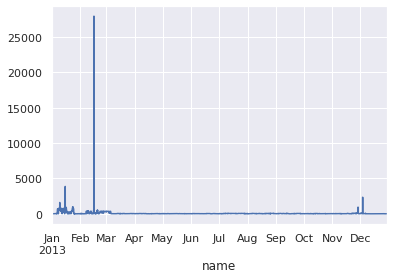

In [220]:
#Understanding why the LCOS is so high
elec_price['GB4 0'].loc[n.snapshots[0]:n.snapshots[8700]].plot()
#elec_price.max()

In [221]:
elec_price = elec_price.reset_index(drop=True) ##clears row index
elec_price = elec_price.transpose().reset_index(drop=True) ##clear column index
elec_price = elec_price.transpose() #transpose back to original shape

charging_energy = charging_energy.reset_index(drop=True) ##clears row index
charging_energy = charging_energy.transpose().reset_index(drop=True) ##clear column index
charging_energy = charging_energy.transpose() #transpose back to original shape

charging_cost = charging_energy.loc[:] * elec_price.loc[:]  # charging cost per bus with time information
charging_cost = charging_cost.sum() # charging cost per bus
charging_cost.head()

0    2.003500e+06
1    3.593973e+05
2    4.324949e+05
3    2.761418e+05
4    1.926035e+06
dtype: float64

LCOS-calculation: [€/MWh]

In [222]:
LCOS_battery = (CAPEX+charging_cost)/total_discharged_amount
CAPEX_battery = CAPEX
charging_cost_battery = charging_cost
#LCOS_low_case

Market-size calculation: \
[MW] discharge_unit = charging_unit,  
[MWh] capacity = max_hours*discharge_unit

In [223]:
#market-size per bus
market_size_inverter = installed_capacity_inverter.reset_index(drop=True)
market_size_battery = installed_capacity_battery.reset_index(drop=True)

Full-load-hour calculation:

In [224]:
# discharged net amount per bus [MWh] / effective built discharge unit [MW]

In [225]:
nom_install_capacity = market_size_inverter
eff_install_capacity = nom_install_capacity * dispatch_effi
eff_install_capacity = eff_install_capacity.reset_index(drop=True)

In [226]:
FLH_battery = total_discharged_amount / eff_install_capacity
#FLH_low_LCOS

# H2-case (combination of H2 tech at a node)

In [227]:
CAPEX_H2_case = CAPEX_high_LCOS + CAPEX_low_LCOS
charging_cost_H2_case = charging_cost_high_LCOS + charging_cost_low_LCOS

In [228]:
LCOS_H2_case = ((CAPEX_high_LCOS + charging_cost_high_LCOS) + (CAPEX_low_LCOS + charging_cost_low_LCOS)) / (total_discharged_amount_low_LCOS + total_discharged_amount_high_LCOS)

In [229]:
market_size_electrolysor_H2_case = (market_size_electrolysor_high_LCOS + market_size_electrolysor_low_LCOS)

In [230]:
market_size_H2_storage = market_size_H2_storage_high_LCOS

In [231]:
market_size_fuel_cell_H2_case = (market_size_fuel_cell_high_LCOS + market_size_fuel_cell_low_LCOS)

In [232]:
eff_install_capacity_H2_case = eff_install_capacity_high_LCOS + eff_install_capacity_low_LCOS
FLH_H2_case = (total_discharged_amount_low_LCOS + total_discharged_amount_high_LCOS) / eff_install_capacity
#FLH_low_LCOS

### LCOS plot

In [254]:
charging_energy = n.links_t.p0.filter(like='battery charger', axis='columns')
index_filter = charging_energy.transpose().index
index_clean = index_filter.str[:6]
index_clean.values.shape

(181,)

In [255]:
bus_load_annual_energy = n.loads_t.p_set.sum().reset_index(drop=True)
bus_load_peak_capacity = n.loads_t.p_set.max().reset_index(drop=True)
#bus_load_peak_capacity 

In [256]:
len(LCOS_high_case.values)

181

In [257]:
df_H2_case = pd.DataFrame(data=LCOS_H2_case.values,columns=['LCOS'])
df_H2_case['unit']='H2_case'
df_H2_case['country']= index_clean
df_H2_case['market_size_charge']= market_size_electrolysor_H2_case
df_H2_case['market_size_storage']= market_size_H2_storage
df_H2_case['market_size_discharge']= market_size_fuel_cell_H2_case
df_H2_case['E/P ratio charge']= market_size_H2_storage / market_size_electrolysor_H2_case
df_H2_case['E/P ratio discharge']= market_size_H2_storage / market_size_fuel_cell_H2_case
df_H2_case['FLH']= FLH_H2_case
df_H2_case['Annual cycles'] = FLH_H2_case/df_H2_case['E/P ratio discharge']
df_H2_case['Installed power to yearly peak load'] = (market_size_fuel_cell_H2_case/bus_load_peak_capacity)    #storage power installed to peak load at bus
df_H2_case['Installed energy to yearly load'] =  market_size_H2_storage/bus_load_annual_energy       #storage energy to yearly load at bus
df_H2_case['CAPEX']= CAPEX_H2_case
df_H2_case['charging_costs']= charging_cost_H2_case
#df_H2_case

In [258]:
df_high_LCOS = pd.DataFrame(data=LCOS_high_case.values,columns=['LCOS'])
df_high_LCOS['LCOS'] = 0.01 ### set low to be beleted in cleaning section below
df_high_LCOS['unit']='H2-high-LCOS'
df_high_LCOS['country']= index_clean
df_high_LCOS['market_size_charge']= market_size_electrolysor_high_LCOS
df_high_LCOS['market_size_storage']= market_size_H2_storage_high_LCOS
df_high_LCOS['market_size_discharge']= market_size_fuel_cell_high_LCOS
df_high_LCOS['E/P ratio charge']= market_size_H2_storage_high_LCOS/market_size_electrolysor_high_LCOS
df_high_LCOS['E/P ratio discharge']= market_size_H2_storage_high_LCOS/market_size_fuel_cell_high_LCOS
df_high_LCOS['FLH']= FLH_high_LCOS
df_high_LCOS['Annual cycles'] = FLH_high_LCOS/df_high_LCOS['E/P ratio discharge']
df_high_LCOS['Installed power to yearly peak load'] = (market_size_fuel_cell_high_LCOS/bus_load_peak_capacity)    #storage power installed to peak load at bus
df_high_LCOS['Installed energy to yearly load'] =  market_size_H2_storage_high_LCOS/bus_load_annual_energy       #storage energy to yearly load at bus
df_high_LCOS['CAPEX']= CAPEX_high_LCOS
df_high_LCOS['charging_costs']= charging_cost_high_LCOS
#df_high_LCOS

In [259]:
charging_energy = n.links_t.p0.filter(like='battery charger', axis='columns')
index_filter = charging_energy.transpose().index
index_clean = index_filter.str[:6]
index_clean.values.shape

(181,)

In [261]:
df_low_LCOS = pd.DataFrame(data=LCOS_low_case.values,columns=['LCOS'])
df_low_LCOS['LCOS'] = 0.01 ### set low to be beleted in cleaning section below
df_low_LCOS['unit']='H2-low-LCOS'
df_low_LCOS['country']= index_clean
df_low_LCOS['market_size_charge']= market_size_electrolysor_low_LCOS
df_low_LCOS['market_size_storage']= market_size_H2_storage_low_LCOS
df_low_LCOS['market_size_discharge']= market_size_fuel_cell_low_LCOS
df_low_LCOS['E/P ratio charge']= market_size_H2_storage_low_LCOS/market_size_electrolysor_low_LCOS
df_low_LCOS['E/P ratio discharge']= market_size_H2_storage_low_LCOS/market_size_fuel_cell_low_LCOS
df_low_LCOS['FLH']= FLH_low_LCOS
df_low_LCOS['Annual cycles'] = FLH_low_LCOS/df_low_LCOS['E/P ratio discharge']
df_low_LCOS['Installed power to yearly peak load'] = (market_size_fuel_cell_low_LCOS/bus_load_peak_capacity)    #storage power installed to peak load at bus
df_low_LCOS['Installed energy to yearly load'] =  market_size_H2_storage_low_LCOS/bus_load_annual_energy       #storage energy to yearly load at bus
df_low_LCOS['CAPEX']= CAPEX_low_LCOS
df_low_LCOS['charging_costs']= charging_cost_low_LCOS
#df_low_LCOS

In [262]:
charging_energy = n.links_t.p0.filter(like='battery charger', axis='columns')
index_filter = charging_energy.transpose().index
index_clean = index_filter.str[:6]
index_clean.values.shape

(181,)

In [263]:
df_battery = pd.DataFrame(data=LCOS_battery.values,columns=['LCOS'])
df_battery['unit']='battery'
##I need a discharger, inverter index'
df_battery['country']= index_clean
df_battery['market_size_charge']= market_size_inverter #both charge and discharge market size
df_battery['market_size_storage']= market_size_battery
df_battery['market_size_discharge']= market_size_inverter #both charge and discharge market size
df_battery['E/P ratio charge']= market_size_battery/market_size_inverter
df_battery['E/P ratio discharge']= market_size_battery/market_size_inverter
df_battery['FLH']= FLH_battery
df_battery['Annual cycles'] = FLH_battery/df_battery['E/P ratio discharge']
df_battery['Installed power to yearly peak load'] = (market_size_inverter/bus_load_peak_capacity)    #storage power installed to peak load at bus
df_battery['Installed energy to yearly load'] =  market_size_battery/bus_load_annual_energy       #storage energy to yearly load at bus
df_battery['CAPEX']= CAPEX_battery
df_battery['charging_costs']= charging_cost_battery
#df_battery

In [264]:
#Combine both tables

iris = df_H2_case.append(df_low_LCOS, ignore_index=True, sort=False)
iris = iris.append(df_high_LCOS, ignore_index=True, sort=False)
iris = iris.append(df_battery, ignore_index=True, sort=False)

In [265]:
#iris.iloc[80:140]

In [266]:
#delete rows with market size below 10 and formatting

indexNames = iris[(iris['market_size_charge'] <= 10) | 
                   (iris['market_size_storage'] <= 10) |
                   (iris['market_size_discharge'] <= 10) |
                   (iris['FLH'] <= 1) |
                   (iris['LCOS'] <= 1) |
                   (iris['LCOS'] >= 1000) ].index
iris = iris.drop(indexNames)

indexNames
iris


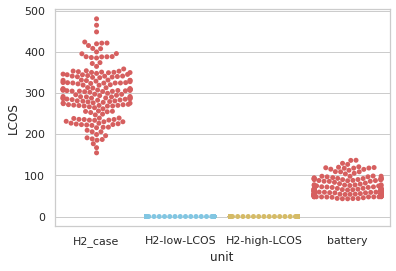

In [267]:
import pandas as pd
import seaborn as sns
sns.set(style="whitegrid", palette="muted")

# Load the example iris dataset
# iris = sns.load_dataset("iris")

# "Melt" the dataset to "long-form" or "tidy" representation
#iris = pd.melt(iris, "country", var_name="unit")

# Draw a categorical scatterplot to show each observation
sns.swarmplot(x="unit", y="LCOS",
              palette=["r", "c", "y"], data=iris)

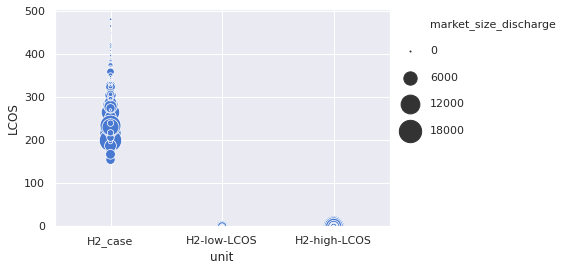

In [268]:
import seaborn as sns
sns.set(style="darkgrid", palette="muted")

# Load the example planets dataset
#planets = sns.load_dataset("planets")

cmap = sns.cubehelix_palette(rot=-.2, as_cmap=True)
ax = sns.scatterplot(x="unit", y="LCOS",
                     size="market_size_discharge",
                     palette=cmap, sizes=(1, 500),
                     data=iris)

plt.ylim(0, None)
plt.xlim(-0.5, 2.5)
plt.legend(labelspacing=20)
# 5. Place legend to the right
plt.legend(bbox_to_anchor=(1, 1), loc=2, frameon = False, labelspacing = 1.5)

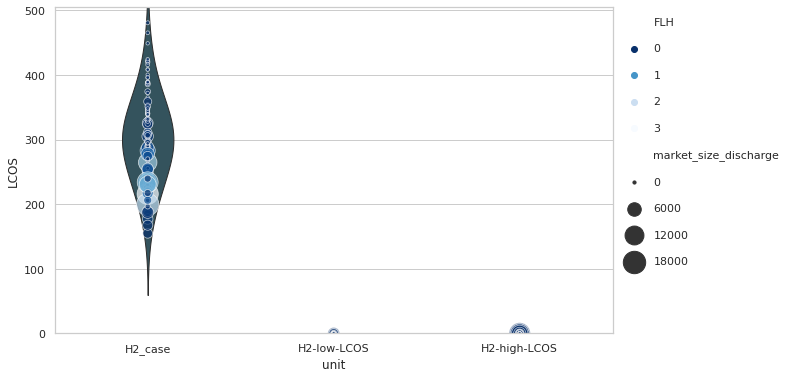

In [269]:
sns.set(style="whitegrid", palette="muted")
plt.figure(figsize=(10,6))
sns.color_palette("PuBuGn_d")
sns.violinplot(data=iris, 
               x="unit", 
               y="LCOS", 
               palette="PuBuGn_d",
               bw=.8, 
               linewidth=1, 
               inner = None)

sns.scatterplot(x="unit", 
                y="LCOS",
                size="market_size_discharge",
                palette="Blues_r", 
                alpha=0.7,
                sizes=(10, 500),
                hue="FLH",
                data=iris,
                )

plt.ylim(0, None)
plt.xlim(-0.5, 2.5)

# 5. Place legend to the right
plt.legend(bbox_to_anchor=(1, 1), loc=2, frameon = False, labelspacing = 1.5)

### Energy storage statistics
- E/P ratio: bus wise and aggregated, per technology and in total 
- Annual cycles: bus wise and aggregated, per technology and in total 
- Storage-power-to-load-peak ratio: bus wise and aggregated, per technology and in total 
- Storage-energy-to-yearly-load: bus wise and aggregated, per technology and in total 
- FLH: bus wise and aggregated, per technology and in total
- market size per component

In [270]:
##ENERGY STORAGE STATS##

iris = iris.style.format({
    'Installed power to yearly peak load': '{:,.2%}'.format,
    'Installed energy to yearly load': '{:,.2%}'.format,
    'market_size_charge': '{:,.0f}'.format,
    'market_size_storage': '{:,.0f}'.format,
    'market_size_discharge': '{:,.0f}'.format,
    'E/P ratio charge': '{:,.0f}'.format,
    'E/P ratio discharge': '{:,.0f}'.format,
    'FLH': '{:,.0f}'.format,
    'Annual cycles': '{:,.0f}'.format,
    'CAPEX': '{:,.0f}'.format,
    'charging_costs': '{:,.0f}'.format,          
})# Format to percentage

In [271]:
#iris

,LCOS,unit,country,market_size_charge,market_size_storage,market_size_discharge,E/P ratio charge,E/P ratio discharge,FLH,Annual cycles,Installed power to yearly peak load,Installed energy to yearly load,CAPEX,charging_costs
0,209.828645,H2_case,AL0 0,144,"12,526",234,87,53,"5,301",99,27.71%,0.28%,"16,218,391","8,379,527"
1,324.624097,H2_case,AT0 0,4,455,28,125,16,841,52,0.91%,0.00%,"896,521","249,073"
2,374.453263,H2_case,AT0 1,21,"3,500",808,163,4,"2,769",639,12.83%,0.01%,"3,006,420","2,076,631"
3,337.846571,H2_case,AT0 2,6,"1,050",71,191,15,"1,375",93,5.63%,0.01%,"1,357,196","473,738"
4,281.311207,H2_case,BA0 0,234,"29,006","1,020",124,28,"8,576",301,49.16%,0.23%,"34,062,072","17,000,232"
5,249.141570,H2_case,BE0 0,728,"145,856","2,158",200,68,"184,145","2,725",50.43%,0.54%,"143,759,873","48,097,429"
6,310.170817,H2_case,BE0 1,100,"19,949",409,200,49,"22,761",466,30.10%,0.23%,"22,597,532","5,518,805"
7,303.741579,H2_case,BE0 2,137,"27,054",612,198,44,"31,405",710,24.30%,0.17%,"30,602,108","8,190,786"
8,256.067233,H2_case,BE0 3,322,"65,043","1,534",202,42,"80,195","1,892",56.58%,0.38%,"64,367,136","19,131,698"
9,310.094841,H2_case,BE0 4,35,"7,115",180,201,40,"8,288",209,7.03%,0.04%,"8,093,019","2,088,136"


### Generator statistics
- Installed capacity
- Share of total capcity
- Capacity factor
- Curtailments

In [833]:
#generator_stats

In [623]:
generator_stats2 = shares.join(generator_stats.groupby('carrier').Curtailment_in_MWh.sum())
generator_stats2 = generator_stats2.join(generator_stats.groupby('carrier').curtailment_in_percentage.mean())
generator_stats2

,Energy generation per year [MWh],in %,Capacity factor,Curtailment_in_MWh,curtailment_in_percentage
biomass,8.161127e+07,0.027829,0.940874,0.000000e+00,NaN
geothermal,0.000000e+00,0.000000,0.000000,0.000000e+00,NaN
nuclear,7.422703e+08,0.253111,0.867192,0.000000e+00,NaN
offwind-ac,3.144620e+08,0.107230,0.426245,2.203181e+06,0.170755
offwind-dc,6.404440e+08,0.218389,0.519241,5.377601e+06,0.087382
onwind,6.474439e+08,0.220776,0.280492,7.479750e+06,0.268076
ror,1.397681e+08,0.047660,0.462419,4.313131e+05,0.024641
solar,3.665861e+08,0.125004,0.127723,3.556952e+06,0.172691


### General energy system statistics
- Total system costs
- Total system costs per load (MWh)
- Network expansion in TWkm and as percentage of existing grid
- Curtailmaint as % of load
- National equity = 80%

In [620]:
#Curtailment_per_total_load = generator_stats.Curtailment_in_MWh.sum()/n.loads_t.p_set.sum().sum()

In [624]:
df_system_stats = pd.DataFrame(data= [n.objective] ,columns=['Total system costs'])
df_system_stats['Total system costs per load [€/MWh]']= n.objective/n.loads_t.p_set.sum().sum()
df_system_stats['Network expansion as percentage of existing grid']= ((n.lines.s_nom_opt - n.lines.s_nom).sum()+(n.links.p_nom_opt - n.links.p_nom).sum())/(n.lines.s_nom.sum()+n.links.p_nom.sum())
df_system_stats['Curtailment as percentage of load'] = generator_stats2.Curtailment_in_MWh.sum()/n.loads_t.p_set.sum().sum()
df_system_stats

,Total system costs,Total system costs per load [€/MWh],Network expansion as percentage of existing grid,Curtailment as percentage of load
0,1.397318e+11,44.533275,0.415735,0.006071
